# Project Overview: Bank Transaction Analysis

Hello, my name is Widya.
In this project, I will perform an exploratory data analysis (EDA) on bank transaction data, identify spending patterns, and detect potential anomalies using machine learning techniques.

## Data Loading and Initial Inspection

In [133]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [134]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [135]:
url = "/content/drive/MyDrive/Portfolio/Datasets/bank_transactions_data_2.csv"
df = pd.read_csv(url)

In [136]:
pd.set_option('display.max_columns', None)

In [137]:
print(df)

     TransactionID AccountID  TransactionAmount      TransactionDate  \
0         TX000001   AC00128              14.09  2023-04-11 16:29:14   
1         TX000002   AC00455             376.24  2023-06-27 16:44:19   
2         TX000003   AC00019             126.29  2023-07-10 18:16:08   
3         TX000004   AC00070             184.50  2023-05-05 16:32:11   
4         TX000005   AC00411              13.45  2023-10-16 17:51:24   
...            ...       ...                ...                  ...   
2507      TX002508   AC00297             856.21  2023-04-26 17:09:36   
2508      TX002509   AC00322             251.54  2023-03-22 17:36:48   
2509      TX002510   AC00095              28.63  2023-08-21 17:08:50   
2510      TX002511   AC00118             185.97  2023-02-24 16:24:46   
2511      TX002512   AC00009             243.08  2023-02-14 16:21:23   

     TransactionType          Location DeviceID      IP Address MerchantID  \
0              Debit         San Diego  D000380  162.198.

In [138]:
missing = df.isnull().sum()
missing = missing[missing > 0]
missing.sort_values(ascending=False)

,0


In [139]:
print(df.info())
print(df.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2512 entries, 0 to 2511
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   TransactionID            2512 non-null   object 
 1   AccountID                2512 non-null   object 
 2   TransactionAmount        2512 non-null   float64
 3   TransactionDate          2512 non-null   object 
 4   TransactionType          2512 non-null   object 
 5   Location                 2512 non-null   object 
 6   DeviceID                 2512 non-null   object 
 7   IP Address               2512 non-null   object 
 8   MerchantID               2512 non-null   object 
 9   Channel                  2512 non-null   object 
 10  CustomerAge              2512 non-null   int64  
 11  CustomerOccupation       2512 non-null   object 
 12  TransactionDuration      2512 non-null   int64  
 13  LoginAttempts            2512 non-null   int64  
 14  AccountBalance          

## Feature Engineering

From the dataframe info we see that the TransactionDate and PreviousTransactionDate is not in the right data type, so we'll do some feature engineering.

In [140]:
# Date/Time Features

df["TransactionDate"] = pd.to_datetime(df["TransactionDate"])
df["PreviousTransactionDate"] = pd.to_datetime(df["PreviousTransactionDate"])
df["DaysSinceLastTransaction"] = (df["PreviousTransactionDate"] - df["TransactionDate"]).dt.days
df["TransactionHour"] = df["TransactionDate"].dt.hour
df["TransactionDayNum"] = df["TransactionDate"].dt.dayofweek
day_names = {
    0: 'Monday',
    1: 'Tuesday',
    2: 'Wednesday',
    3: 'Thursday',
    4: 'Friday',
    5: 'Saturday',
    6: 'Sunday'
}
df['TransactionDay'] = df['TransactionDayNum'].map(day_names)

print(df[['TransactionDate', 'PreviousTransactionDate', 'DaysSinceLastTransaction', 'TransactionHour', 'TransactionDayNum', 'TransactionDay']].head())

      TransactionDate PreviousTransactionDate  DaysSinceLastTransaction  \
0 2023-04-11 16:29:14     2024-11-04 08:08:08                       572   
1 2023-06-27 16:44:19     2024-11-04 08:09:35                       495   
2 2023-07-10 18:16:08     2024-11-04 08:07:04                       482   
3 2023-05-05 16:32:11     2024-11-04 08:09:06                       548   
4 2023-10-16 17:51:24     2024-11-04 08:06:39                       384   

   TransactionHour  TransactionDayNum TransactionDay  
0               16                  1        Tuesday  
1               16                  1        Tuesday  
2               18                  0         Monday  
3               16                  4         Friday  
4               17                  0         Monday  


In [141]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# Label Encoding for Ordinal Data
df['TransactionDayEncoded'] = LabelEncoder().fit_transform(df['TransactionDay'])
df["OccupationEncoded"] = LabelEncoder().fit_transform(df["CustomerOccupation"])

# One-Hot Encoding for Nominal Data
cols_to_one_hot_encode = ['TransactionType', 'Channel']
ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoded_data = ohe.fit_transform(df[cols_to_one_hot_encode])

# Create a DataFrame with the new encoded columns
encoded_df = pd.DataFrame(encoded_data, columns=ohe.get_feature_names_out(cols_to_one_hot_encode), index=df.index)

# Add the new encoded columns back to the original DataFrame
df = pd.concat([df, encoded_df], axis=1)

print(f"DataFrame shape after encoding: {df.shape}")
print("\nDataFrame with One-Hot Encoded features created.")

print(df.head())

DataFrame shape after encoding: (2512, 27)

DataFrame with One-Hot Encoded features created.
  TransactionID AccountID  TransactionAmount     TransactionDate  \
0      TX000001   AC00128              14.09 2023-04-11 16:29:14   
1      TX000002   AC00455             376.24 2023-06-27 16:44:19   
2      TX000003   AC00019             126.29 2023-07-10 18:16:08   
3      TX000004   AC00070             184.50 2023-05-05 16:32:11   
4      TX000005   AC00411              13.45 2023-10-16 17:51:24   

  TransactionType   Location DeviceID      IP Address MerchantID Channel  \
0           Debit  San Diego  D000380  162.198.218.92       M015     ATM   
1           Debit    Houston  D000051     13.149.61.4       M052     ATM   
2           Debit       Mesa  D000235  215.97.143.157       M009  Online   
3           Debit    Raleigh  D000187  200.13.225.150       M002  Online   
4          Credit    Atlanta  D000308    65.164.3.100       M091  Online   

   CustomerAge CustomerOccupation  Transa

In [142]:
# Creating New Ratios Feature

df["BalanceChangeRatio"] = df["TransactionAmount"] / df["AccountBalance"]

print(df[['TransactionAmount', 'AccountBalance', 'BalanceChangeRatio']].head())

   TransactionAmount  AccountBalance  BalanceChangeRatio
0              14.09         5112.21            0.002756
1             376.24        13758.91            0.027345
2             126.29         1122.35            0.112523
3             184.50         8569.06            0.021531
4              13.45         7429.40            0.001810


In [143]:
# Creating Age Brackets

bins = [15, 30, 45, 60, 75, 90]
labels = ['15-29', '30-44', '45-59', '60-74', '75-90']

df['AgeBracket'] = pd.cut(
    df['CustomerAge'],
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
)

print(df['AgeBracket'].value_counts())
print(df[['CustomerAge', 'AgeBracket']].head())

AgeBracket
15-29    759
45-59    663
60-74    488
30-44    479
75-90    123
Name: count, dtype: int64
   CustomerAge AgeBracket
0           70      60-74
1           68      60-74
2           19      15-29
3           26      15-29
4           26      15-29


## Exploratory Data Analysis (EDA)

In [144]:
# Descriptive Statistics

df.describe(include='all')

,TransactionID,AccountID,TransactionAmount,TransactionDate,TransactionType,Location,DeviceID,IP Address,MerchantID,Channel,CustomerAge,CustomerOccupation,TransactionDuration,LoginAttempts,AccountBalance,PreviousTransactionDate,DaysSinceLastTransaction,TransactionHour,TransactionDayNum,TransactionDay,TransactionDayEncoded,OccupationEncoded,TransactionType_Credit,TransactionType_Debit,Channel_ATM,Channel_Branch,Channel_Online,BalanceChangeRatio,AgeBracket
count,2512,2512,2512.000000,2512,2512,2512,2512,2512,2512,2512,2512.000000,2512,2512.000000,2512.000000,2512.000000,2512,2512.000000,2512.000000,2512.000000,2512,2512.000000,2512.000000,2512.000000,2512.000000,2512.000000,2512.000000,2512.000000,2512.000000,2512
unique,2512,495,NaN,NaN,2,43,681,592,100,3,NaN,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
top,TX002496,AC00460,NaN,NaN,Debit,Fort Worth,D000548,200.136.146.93,M026,Branch,NaN,Student,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Monday,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15-29
freq,1,12,NaN,NaN,1944,70,9,13,45,868,NaN,657,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,759
mean,NaN,NaN,297.593778,2023-07-05 20:32:10.826433024,NaN,NaN,NaN,NaN,NaN,NaN,44.673965,NaN,119.643312,1.124602,5114.302966,2024-11-04 08:09:22.219745024,486.857882,16.626194,1.448248,NaN,1.691879,1.510350,0.226115,0.773885,0.331608,0.345541,0.322850,0.200013,NaN
min,NaN,NaN,0.260000,2023-01-02 16:00:06,NaN,NaN,NaN,NaN,NaN,NaN,18.000000,NaN,10.000000,1.000000,101.250000,2024-11-04 08:06:23,307.000000,16.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000045,NaN
25%,NaN,NaN,81.885000,2023-04-03 16:22:05.750000128,NaN,NaN,NaN,NaN,NaN,NaN,27.000000,NaN,63.000000,1.000000,1504.370000,2024-11-04 08:07:53,394.000000,16.000000,0.000000,NaN,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.018161,NaN
50%,NaN,NaN,211.140000,2023-07-07 17:49:43.500000,NaN,NaN,NaN,NaN,NaN,NaN,45.000000,NaN,112.500000,1.000000,4735.510000,2024-11-04 08:09:22,485.000000,16.000000,1.000000,NaN,1.000000,1.500000,0.000000,1.000000,0.000000,0.000000,0.000000,0.051922,NaN
75%,NaN,NaN,414.527500,2023-10-06 18:40:53.500000,NaN,NaN,NaN,NaN,NaN,NaN,59.000000,NaN,161.000000,1.000000,7678.820000,2024-11-04 08:10:53.249999872,580.000000,17.000000,3.000000,NaN,3.000000,3.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.151656,NaN
max,NaN,NaN,1919.110000,2024-01-01 18:21:50,NaN,NaN,NaN,NaN,NaN,NaN,80.000000,NaN,300.000000,5.000000,14977.990000,2024-11-04 08:12:23,671.000000,18.000000,4.000000,NaN,4.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.895988,NaN


Summarytools library will also be used for quick overlook into the dataframe.

In [145]:
pip install SummaryTools

In [146]:
from summarytools import dfSummary
dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,TransactionID[object],1. TX0024962. TX0024953. TX0024944. TX0024935. TX0024926. TX0024917. TX0024908. TX0024899. TX00248810. TX00248711. other,"1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)2,502 (99.6%)","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAD+CAYAAAAtWHdlAAAAOnRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjEwLjAsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvlHJYcgAAAAlwSFlzAAAPYQAAD2EBqD+naQAAA0JJREFUeJzt3MFpG2EURtE3QiT2RkIIVELSg4rINh2riDRhpEXieOMsgkvIHZicU8G/uPAQzKfl/f19oLBb+wH8P8RGRmxkxEZGbGTERkZsZMRGRmxkxEZmtyzL12VZntZ+CNu3m5kvM/N57Yewfc4oGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZHZzcyPmfm99kPYvsW/GFFxRsmIjYx1FRnrKjLOKBmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGYMXMgYvZJxRMmIjY/BCxuCFjDNKRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEbG4IWMwQsZZ5SM2MiIjYx1FRnrKjLOKBmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGesqMtZVZJxRMmIjY/BCxuCFjDNKRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEbG4IWMwQsZZ5SM2MgYvJAxeCHjjJIRGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGesqMtZVZJxRMmIjY11FxrqKjDNKRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEbG4IWMwQsZZ5SM2MgYvJAxeCHjjJIRGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkTF4IWPwQsYZJSM2MmIjY11FxrqKjDNKRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEbGuoqMdRUZZ5SM2MgYvJAxeCHjjJIRGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkTF4IWPwQsYZJbPMzPPMfFr7IWze2/58Pn87HA6ntV/Ctj0ej5f94XA4Xa/XX8fj8XXtB7FN9/v96Xa7nfYzM8fj8fVyufxc+1Fs2rMfCGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGT2M38/AVn7IWzXR1/L+Xz+7uNJ/rXH4/His3Aqb9ZVZPxAICM2MmIjIzYyYiMjNjJiIyM2MmIj8wdFqVdsnnPGyQAAAABJRU5ErkJggg=="">",0(0.0%)
2,AccountID[object],1. AC004602. AC002023. AC003624. AC003635. AC004806. AC004567. AC002578. AC002259. AC0030410. AC0021911. other,"12 (0.5%)12 (0.5%)12 (0.5%)12 (0.5%)11 (0.4%)11 (0.4%)11 (0.4%)11 (0.4%)11 (0.4%)10 (0.4%)2,399 (95.5%)","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAD+CAYAAAAtWHdlAAAAOnRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjEwLjAsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvlHJYcgAAAAlwSFlzAAAPYQAAD2EBqD+naQAAA31JREFUeJzt3MFqE1EAhtGbEordTAiBPEweog/rQ+RtQsgsbOkmLowrTRWsXzCesxLczOJjMl7u7+J8Pg8oPNz6Afh/iI2M2MiIjYzYyIiNjNjIiI2M2MgsxhhPY4xxPp9fbvws3LnlZrN5HmOMxWLxWXD8TQ/TNK2naVqPMR5v/TDcN99sZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZmOc/z8fLnt5s+CXfPBoHMwn+ZRcWbjYx1FRnrKjKOPsiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyBi8kHEtnIzBCxlvNjIGL2QMXsg4+iAjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiI2PwQsa1cDIGL2R8s5HxM0rGuoqMdRUZ32xkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGSsq8i4Fk7GuoqMNxsZgxcyBi9kHH2QERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZExeCHjWjgZgxcy3mxkDF7IGLyQcfRBRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGSsq8jYIJCxriLjzUbGuoqMdRUZRx9kxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGQMXsi4Fk7G4IWMNxsZgxcyBi9kHH2QERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZExeCHjWjgZgxcyvtnI+BklY11FxrqKjG82MmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYy1lVkXAsnY11FxpuNjMELGYMXMo4+yIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIGLyQcS2cjMELme9vNlfC+Shv134ll5vN5vmyQYA/Ns/z8dp4ajlN03q3272sVqvXWzwc9+N0On3a7/frw+HwOMb4MbYxxlitVq/b7fZL/nTco6drf+GcjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjcxyjG9XQ279IPz7ftXRcp7n436/X493robA77oMqH46nnItnI929Vq4wQsZ/0AgIzYyYiMjNjJiIyM2MmIjIzYyYiPzFZR1ECdHXRmlAAAAAElFTkSuQmCC"">",0(0.0%)
3,TransactionAmount[float64],Mean (sd) : 297.6 (291.9)min < med < max:0.3 < 211.1 < 1919.1IQR (CV) : 332.6 (1.0),"2,455 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOnRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjEwLjAsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvlHJYcgAAAAlwSFlzAAAPYQAAD2EBqD+naQAAAmRJREFUeJzt3DFv2kAYh/H3CkEGWgMigs0rWwdGln6DftiuHSPBzLdASFYA4YaAkLuUqlLSAHeh9f/0/GZ8ZnhkdMj3urIsDai6D//7CwCXqJ/7gHOuaWYNz/X3ZVk+eV4L/PZmqM65Zr/f/5qmac9n8c1m8+ic+0asCHXuidpI07Q3mUyeOp3O7pqF1+t1Mp1Oe3meN8yMUBHk7E+/mVmn09kNBoMfHus3Pa4BXmAzBQmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECg

From the summary above, I will create visualizations to help stakeholders quickly grasp the overall picture of the data.

In [147]:
# Identify numerical columns (excluding object types, which are typically categorical)
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Identify categorical columns (object and category types)
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

print("Numerical Columns:")
print(numerical_cols)
print("\nCategorical Columns:")
print(categorical_cols)

Numerical Columns:
['TransactionAmount', 'CustomerAge', 'TransactionDuration', 'LoginAttempts', 'AccountBalance', 'DaysSinceLastTransaction', 'TransactionHour', 'TransactionDayNum', 'TransactionDayEncoded', 'OccupationEncoded', 'TransactionType_Credit', 'TransactionType_Debit', 'Channel_ATM', 'Channel_Branch', 'Channel_Online', 'BalanceChangeRatio']

Categorical Columns:
['TransactionID', 'AccountID', 'TransactionType', 'Location', 'DeviceID', 'IP Address', 'MerchantID', 'Channel', 'CustomerOccupation', 'TransactionDay', 'AgeBracket']


Histogram for Numerical Variables


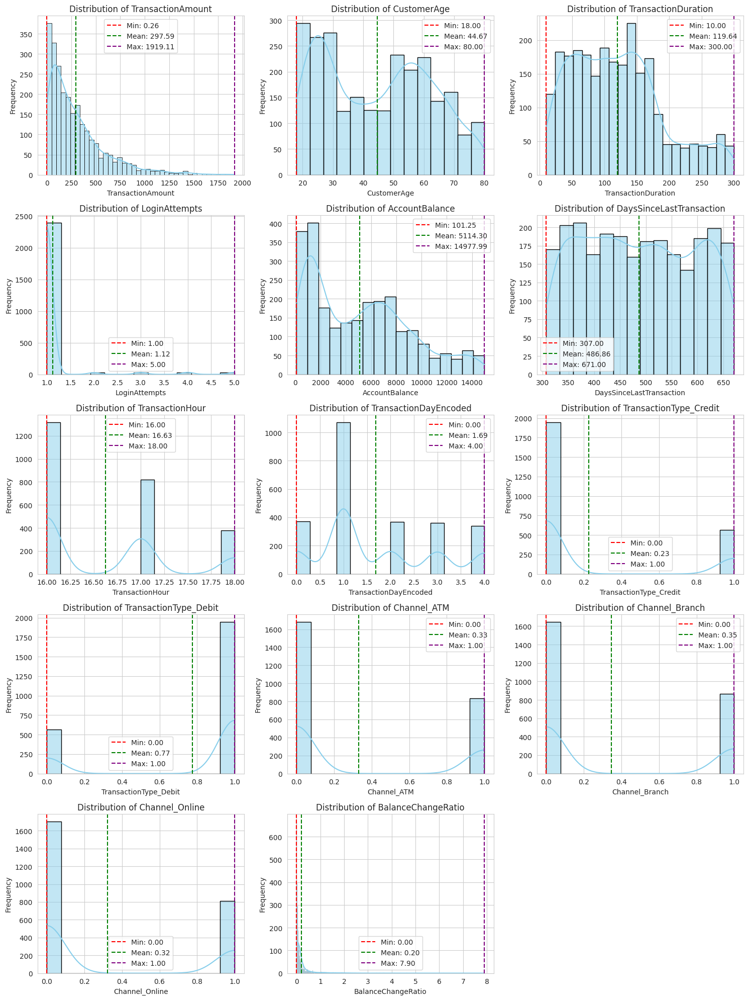

In [148]:
exclude_cols = ['OccupationEncoded', 'TransactionDayNum', 'OccupationEncoded']
numerical_cols = [col for col in numerical_cols if col not in exclude_cols]

print("Histogram for Numerical Variables")

# Determine the number of rows and columns for the subplots
num_plots = len(numerical_cols)
n_cols = 3  # You can adjust this for better layout
n_rows = (num_plots + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()

for i, col in enumerate(numerical_cols):
    sns.histplot(df[col], kde=True, ax=axes[i], color='skyblue', edgecolor='black')

    # Calculate the min, mean, and max values for the current column
    min_val = df[col].min()
    mean_val = df[col].mean()
    max_val = df[col].max()

    # Add vertical lines for min, mean, and max
    axes[i].axvline(min_val, color='red', linestyle='--', label=f'Min: {min_val:.2f}')
    axes[i].axvline(mean_val, color='green', linestyle='--', label=f'Mean: {mean_val:.2f}')
    axes[i].axvline(max_val, color='purple', linestyle='--', label=f'Max: {max_val:.2f}')

    # Add a legend to the plot to identify the lines
    axes[i].legend()

    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [149]:
# --- Helper function to annotate bar charts with their values and percentages ---
def add_annotations(ax, total):
    """A helper function to add the value and percentage of each bar to the plot."""
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height:.0f}\n({height/total:.1%})',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 10),
                    textcoords='offset points')

def add_money_annotations(ax, total_amount):
    """A helper function to add a formatted dollar value and percentage to each bar."""
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'${height:,.0f}\n({height/total_amount:.1%})',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 10),
                    textcoords='offset points')

In [150]:
print("Numerical Columns:")
print(numerical_cols)
print("\nCategorical Columns:")
print(categorical_cols)

Numerical Columns:
['TransactionAmount', 'CustomerAge', 'TransactionDuration', 'LoginAttempts', 'AccountBalance', 'DaysSinceLastTransaction', 'TransactionHour', 'TransactionDayEncoded', 'TransactionType_Credit', 'TransactionType_Debit', 'Channel_ATM', 'Channel_Branch', 'Channel_Online', 'BalanceChangeRatio']

Categorical Columns:
['TransactionID', 'AccountID', 'TransactionType', 'Location', 'DeviceID', 'IP Address', 'MerchantID', 'Channel', 'CustomerOccupation', 'TransactionDay', 'AgeBracket']


Count Plots for Categorical Variables


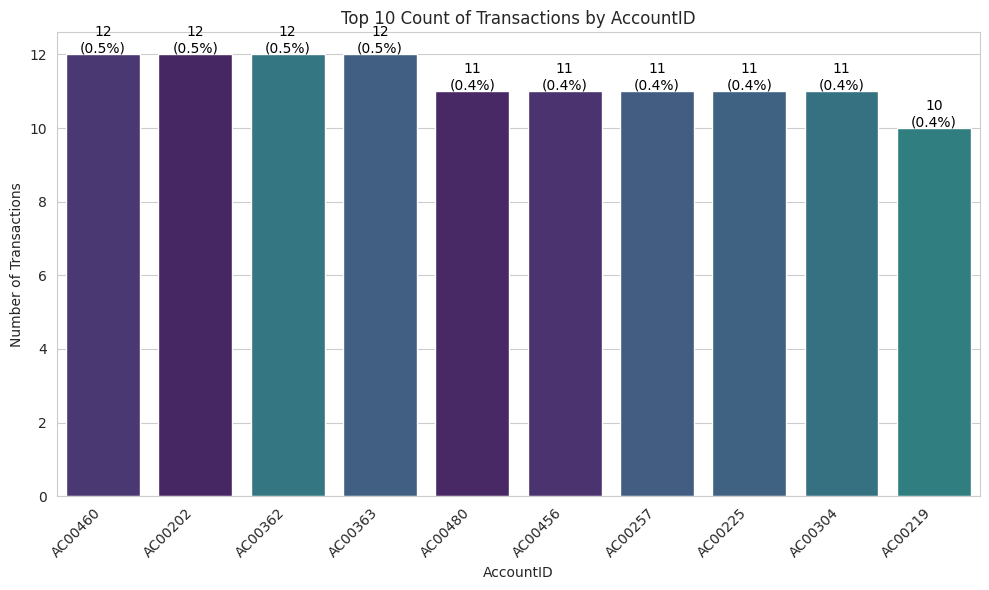

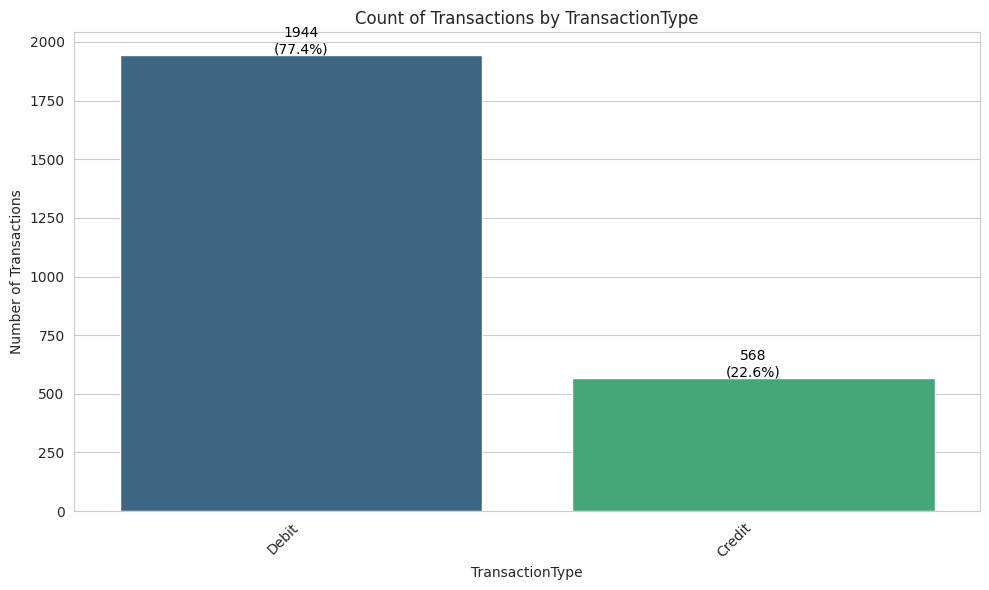

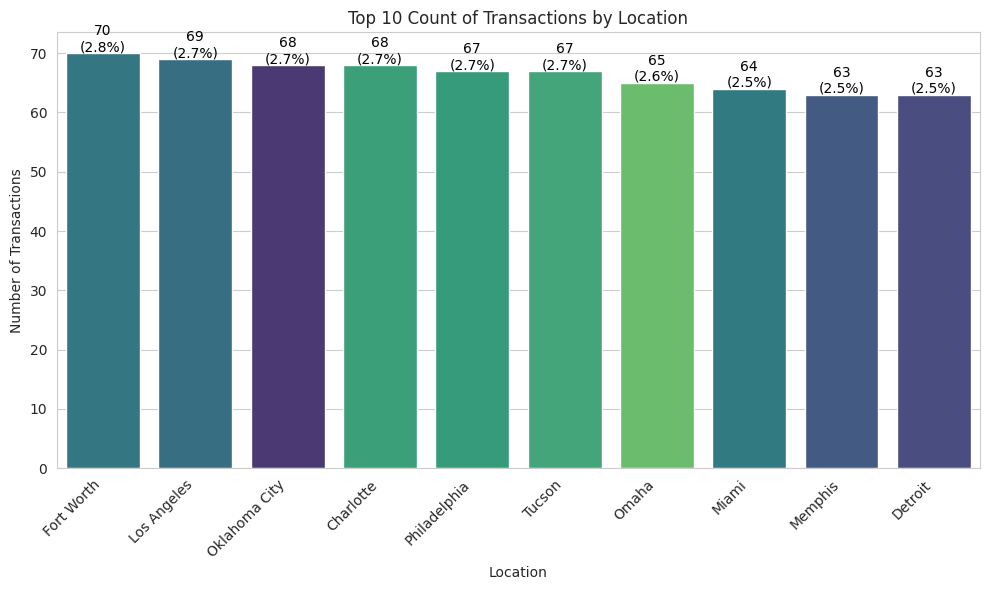

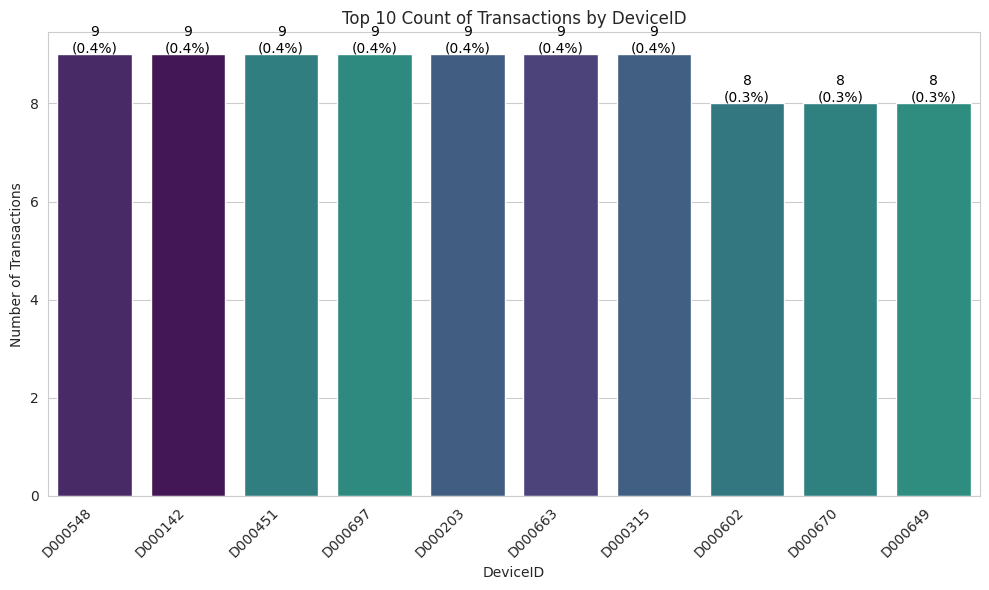

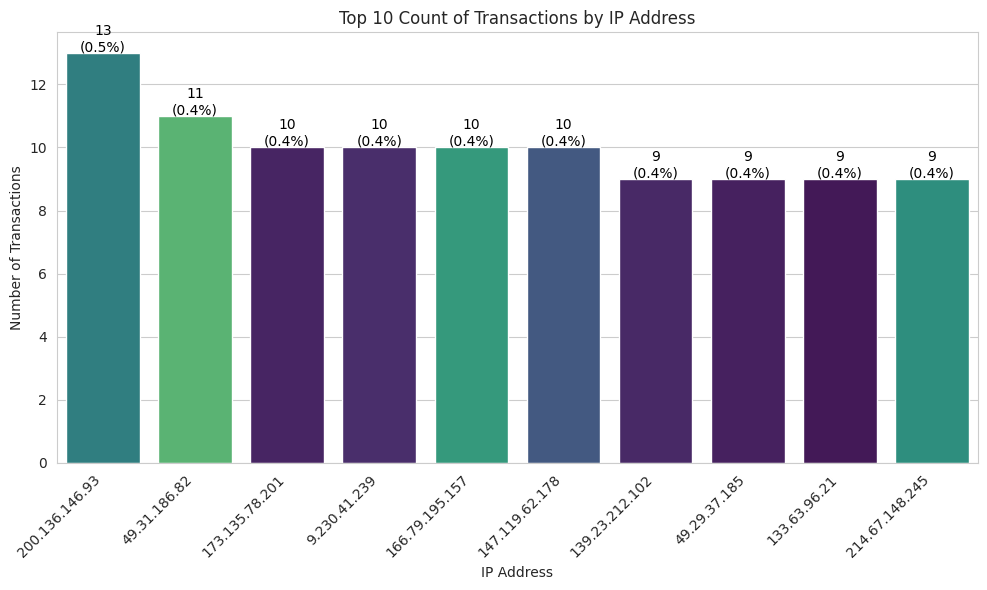

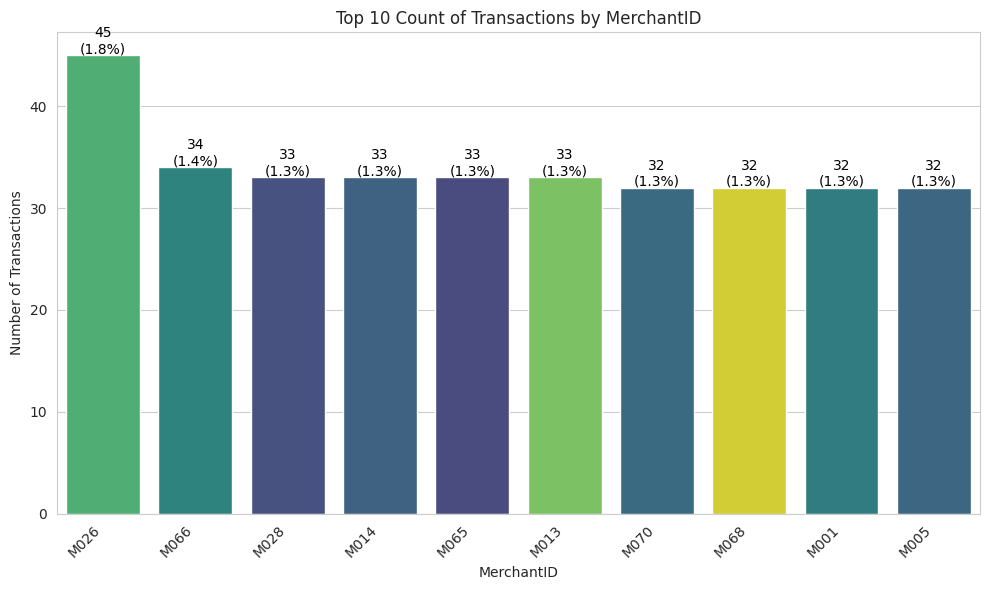

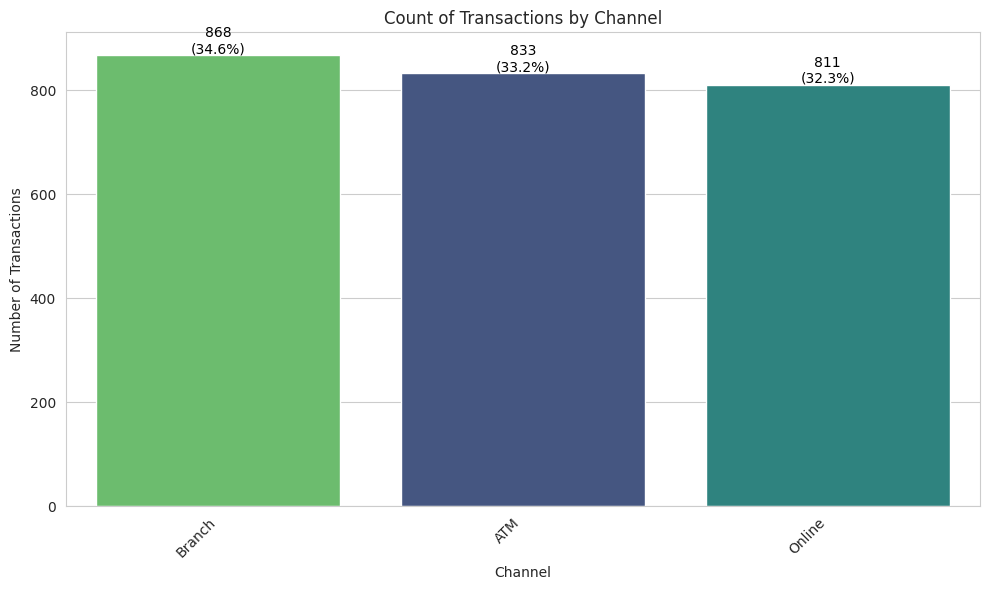

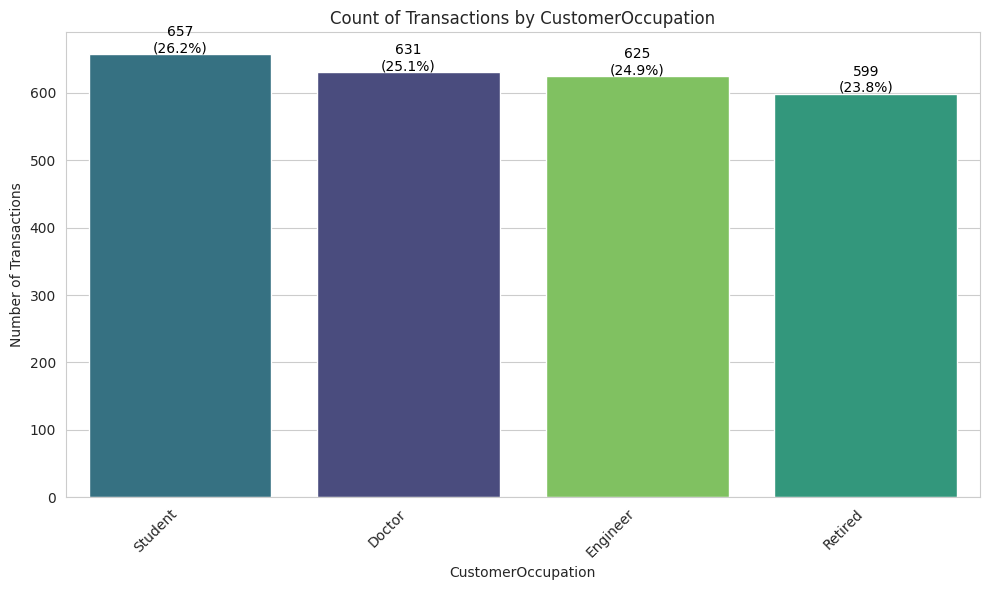

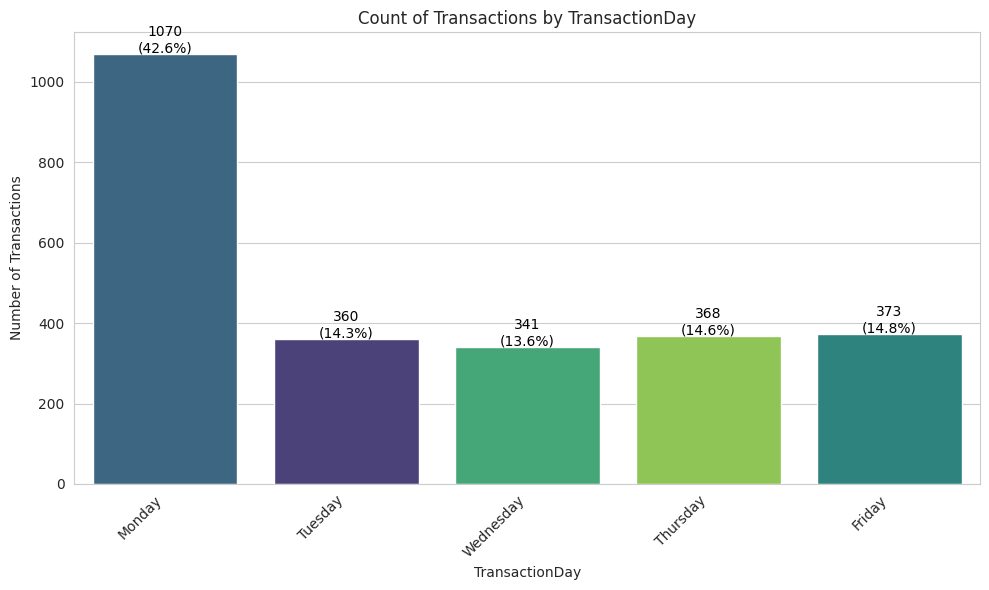

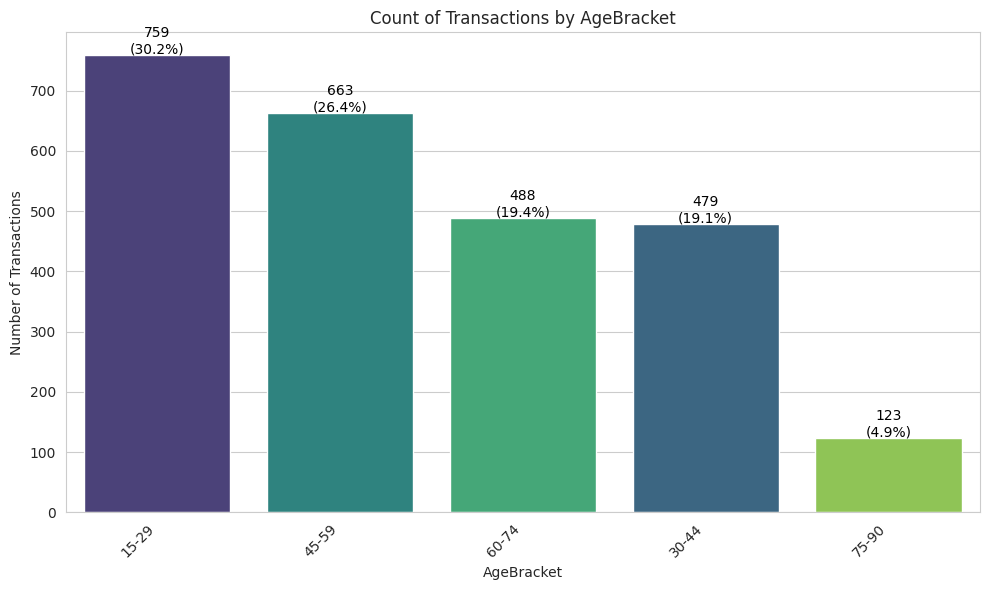

In [151]:
exclude_cols = ['TransactionID']
categorical_cols = [col for col in categorical_cols if col not in exclude_cols]

print("Count Plots for Categorical Variables")
total_transactions = len(df)

for cat_col in categorical_cols:
    if cat_col in df.columns:
        # Order by TransactionDayNum for chronological order
        if cat_col == 'TransactionDay':
            day_order = df.groupby('TransactionDay')['TransactionDayNum'].first().sort_values().index
            plt.figure(figsize=(10, 6))
            ax = sns.countplot(x=cat_col, data=df, palette='viridis', order=day_order, hue=cat_col, legend=False)
            plt.title(f'Count of Transactions by {cat_col}')
            plt.xlabel(cat_col)
            plt.ylabel('Number of Transactions')
            plt.xticks(rotation=45, ha='right')
            add_annotations(ax, total_transactions)
            plt.tight_layout()
            plt.show()
        else:
            # Handle other categorical columns
            if len(df[cat_col].value_counts()) > 10:
                top_10_categories = df[cat_col].value_counts().nlargest(10).index
                plt.figure(figsize=(10, 6))
                ax = sns.countplot(x=cat_col, data=df, palette='viridis', order=top_10_categories, hue=cat_col, legend=False)
                plt.title(f'Top 10 Count of Transactions by {cat_col}')
                plt.xlabel(cat_col)
                plt.ylabel('Number of Transactions')
                plt.xticks(rotation=45, ha='right')
                add_annotations(ax, total_transactions)
                plt.tight_layout()
                plt.show()
            else:
                plt.figure(figsize=(10, 6))
                ax = sns.countplot(x=cat_col, data=df, palette='viridis', order=df[cat_col].value_counts().index, hue=cat_col, legend=False)
                plt.title(f'Count of Transactions by {cat_col}')
                plt.xlabel(cat_col)
                plt.ylabel('Number of Transactions')
                plt.xticks(rotation=45, ha='right')
                add_annotations(ax, total_transactions)
                plt.tight_layout()
                plt.show()
    else:
        print(f"Warning: Column '{cat_col}' not found. Skipping plot.")

In [152]:
# Identify numerical columns (excluding object types, which are typically categorical)
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Identify categorical columns (object and category types)
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

print("Numerical Columns:")
print(numerical_cols)
print("\nCategorical Columns:")
print(categorical_cols)

Numerical Columns:
['TransactionAmount', 'CustomerAge', 'TransactionDuration', 'LoginAttempts', 'AccountBalance', 'DaysSinceLastTransaction', 'TransactionHour', 'TransactionDayNum', 'TransactionDayEncoded', 'OccupationEncoded', 'TransactionType_Credit', 'TransactionType_Debit', 'Channel_ATM', 'Channel_Branch', 'Channel_Online', 'BalanceChangeRatio']

Categorical Columns:
['TransactionID', 'AccountID', 'TransactionType', 'Location', 'DeviceID', 'IP Address', 'MerchantID', 'Channel', 'CustomerOccupation', 'TransactionDay', 'AgeBracket']


TransactionAmount analysis for Categorical Variables


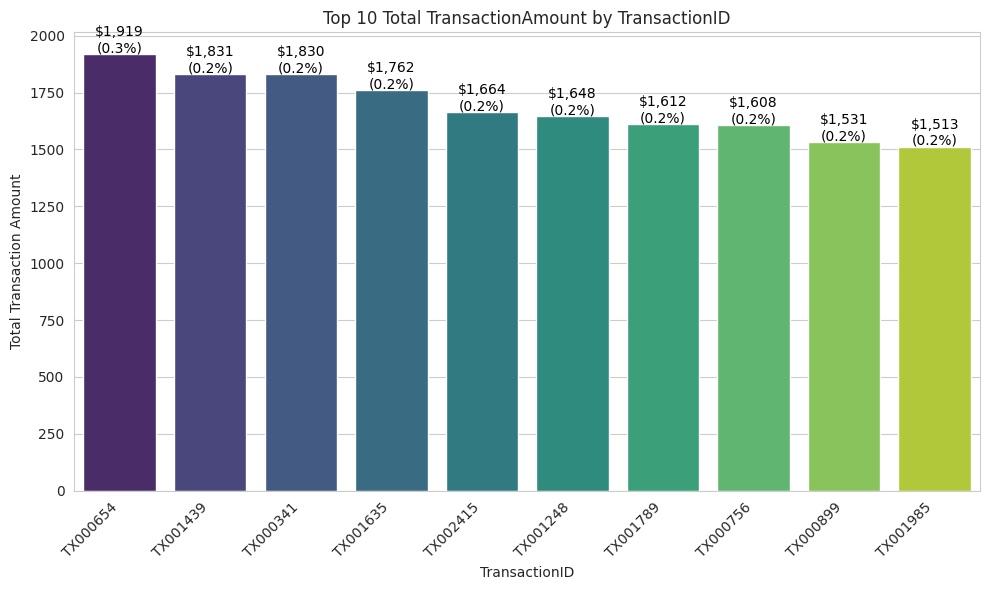

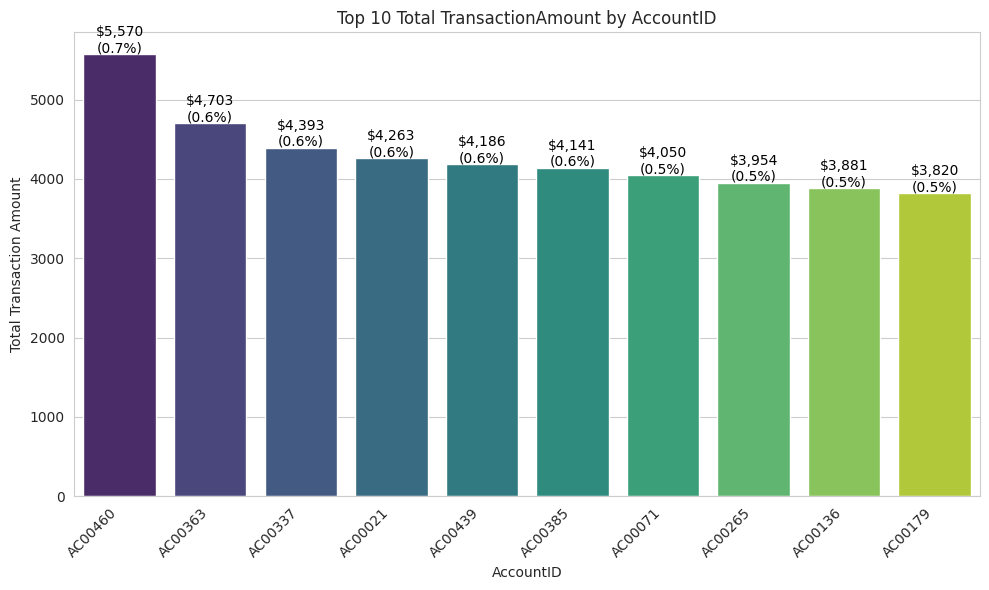

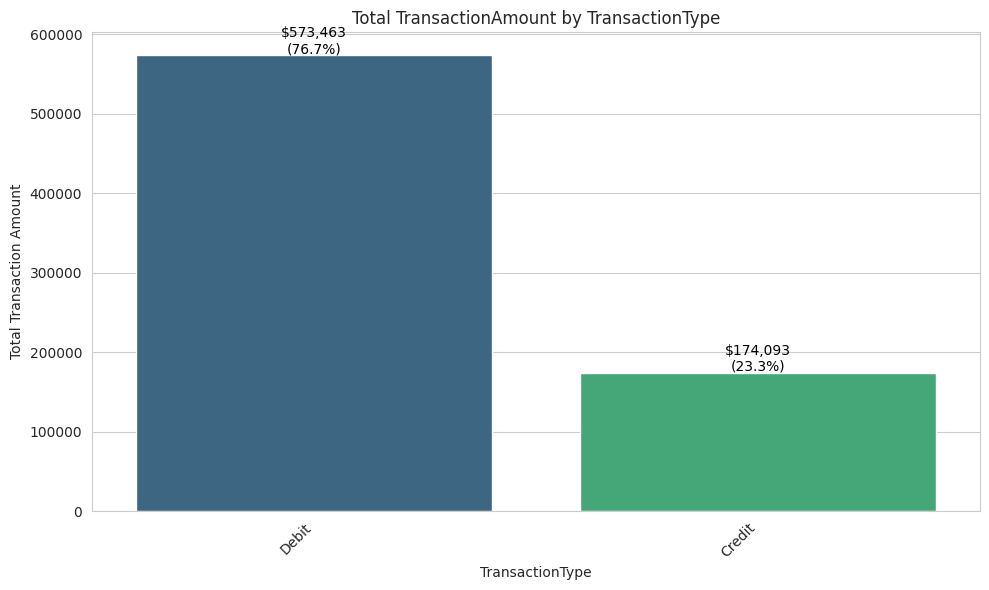

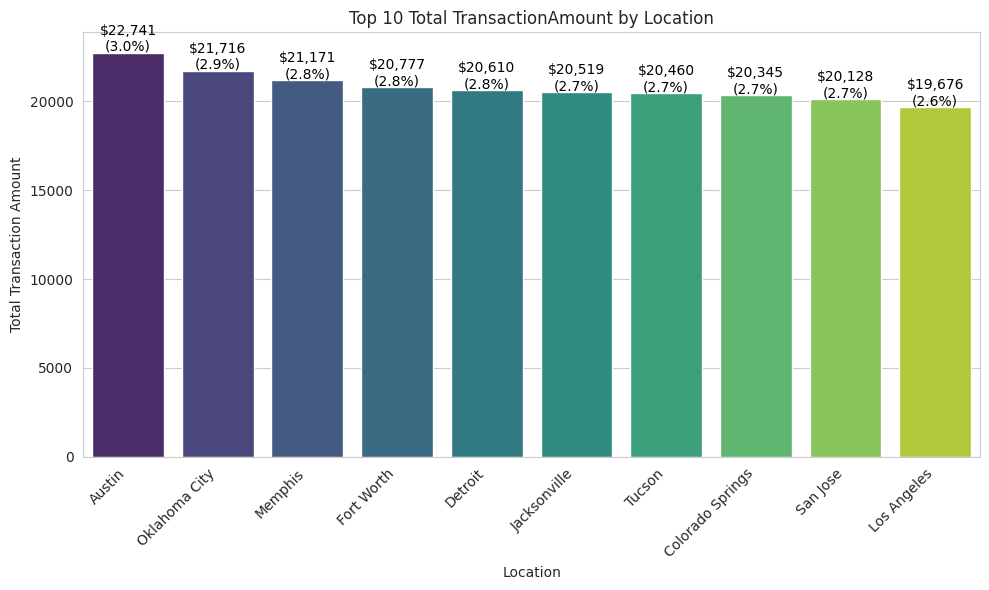

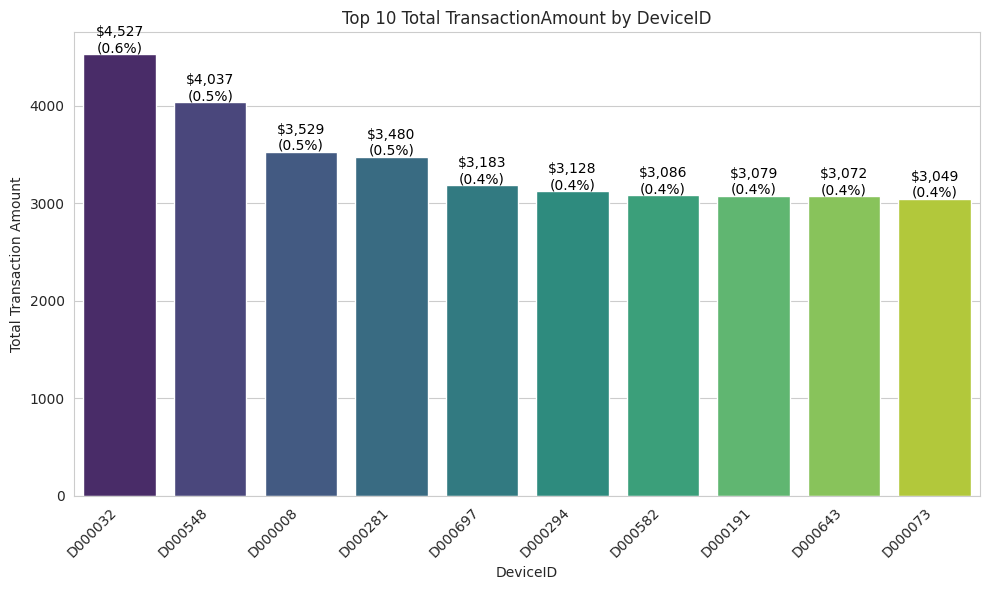

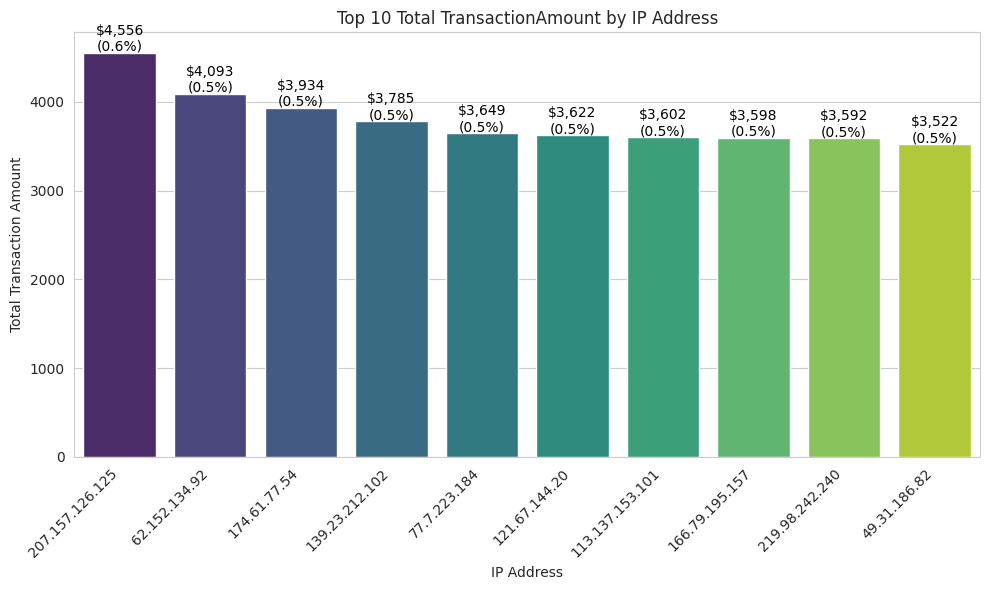

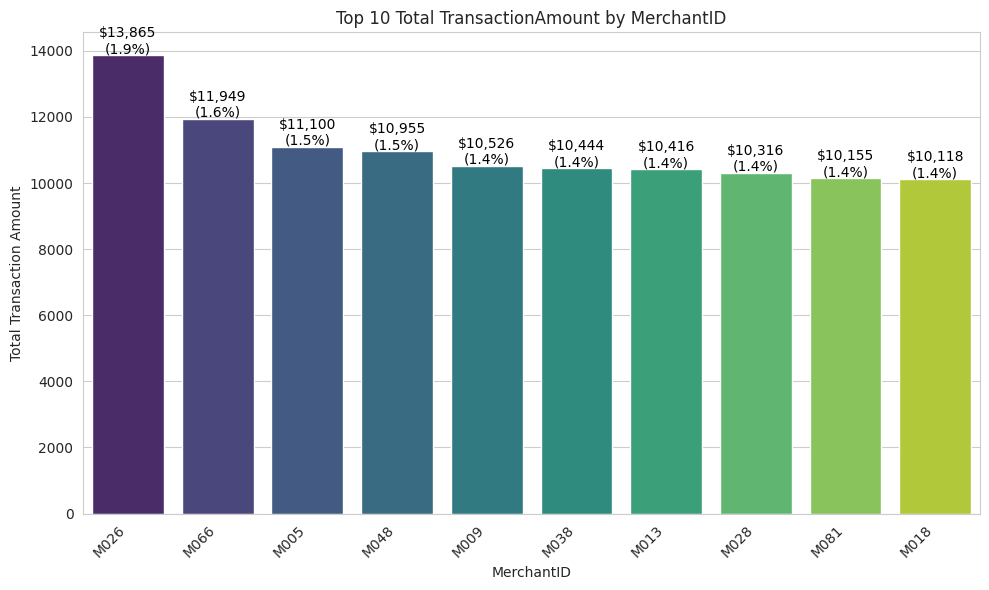

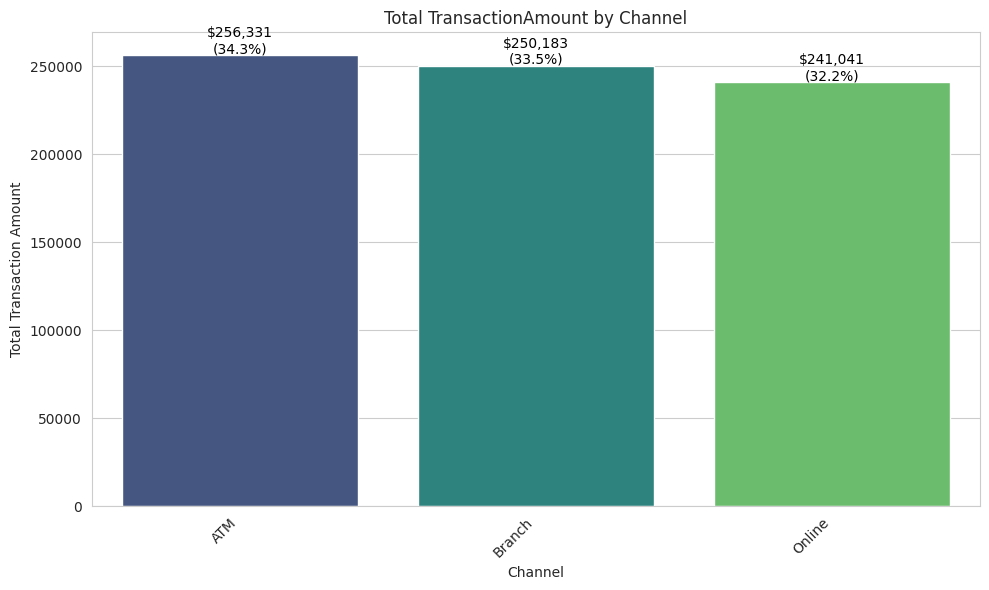

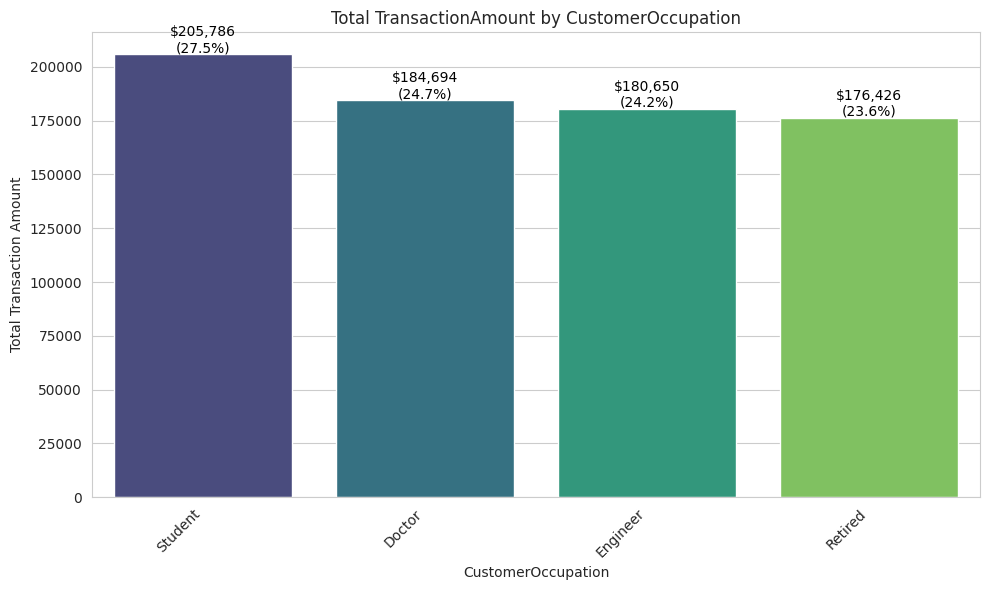

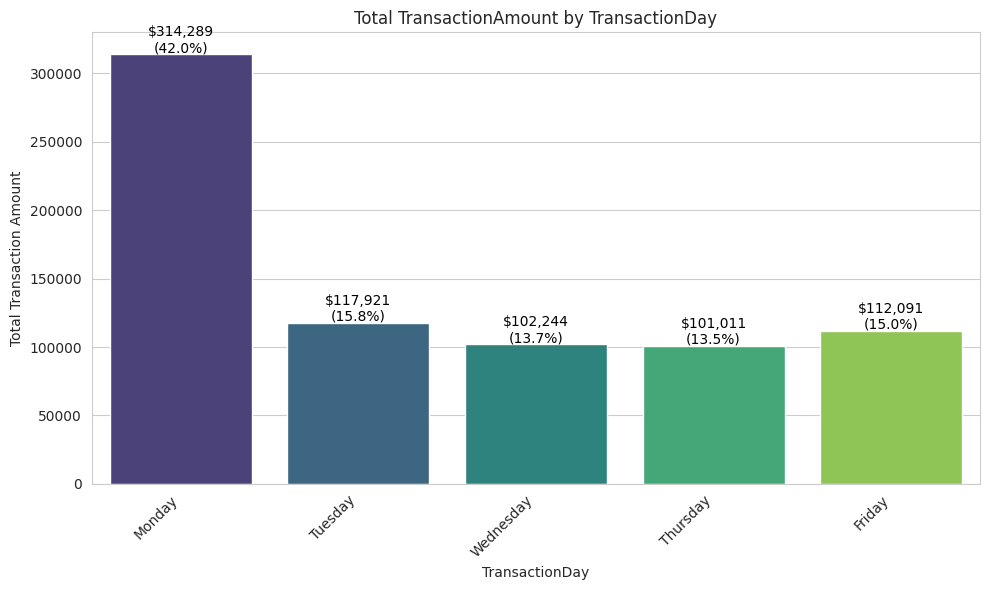

/tmp/ipython-input-2954473628.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  category_sums = df.groupby(cat_col)['TransactionAmount'].sum().sort_values(ascending=False)


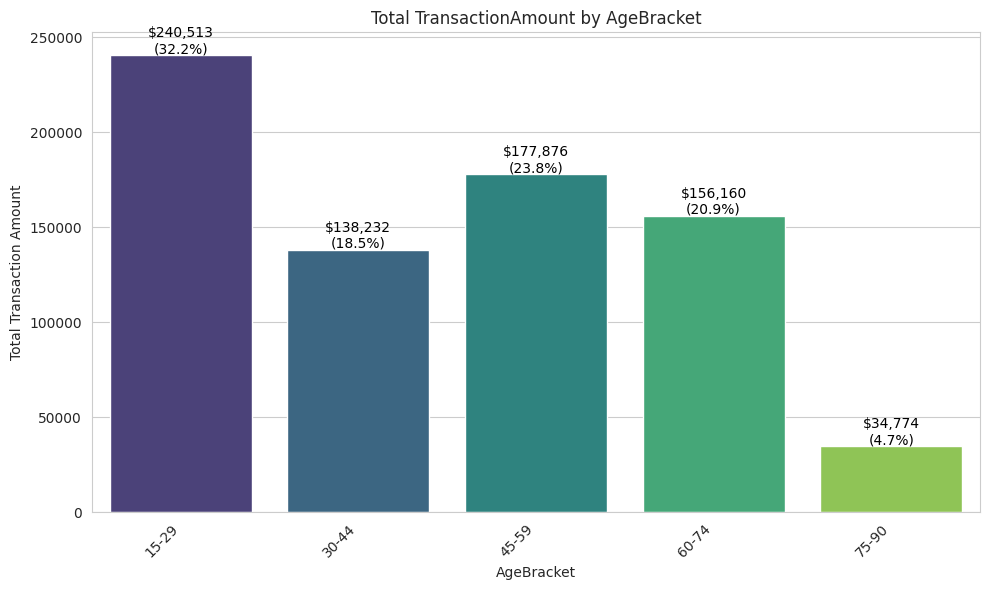

In [153]:
print("TransactionAmount analysis for Categorical Variables")

total_amount = df['TransactionAmount'].sum()

for cat_col in categorical_cols:
    if cat_col in df.columns:
        # Group by the category and sum the transaction amounts
        category_sums = df.groupby(cat_col)['TransactionAmount'].sum().sort_values(ascending=False)

        # Order by TransactionDayNum for chronological order, otherwise order by total amount
        if cat_col == 'TransactionDay':
            day_order = df.groupby('TransactionDay')['TransactionDayNum'].first().sort_values().index
            plt.figure(figsize=(10, 6))
            ax = sns.barplot(x=category_sums.loc[day_order].index, y=category_sums.loc[day_order].values, palette='viridis', hue=category_sums.loc[day_order].index, legend=False)
            plt.title(f'Total TransactionAmount by {cat_col}')
            plt.xlabel(cat_col)
            plt.ylabel('Total Transaction Amount')
            plt.xticks(rotation=45, ha='right')
            add_money_annotations(ax, total_amount)
            plt.tight_layout()
            plt.show()
        else:
            # Handle other categorical columns
            if len(category_sums) > 10:
                top_10_sums = category_sums.nlargest(10)
                plt.figure(figsize=(10, 6))
                ax = sns.barplot(x=top_10_sums.index, y=top_10_sums.values, palette='viridis', hue=top_10_sums.index, legend=False)
                plt.title(f'Top 10 Total TransactionAmount by {cat_col}')
                plt.xlabel(cat_col)
                plt.ylabel('Total Transaction Amount')
                plt.xticks(rotation=45, ha='right')
                add_money_annotations(ax, total_amount)
                plt.tight_layout()
                plt.show()
            else:
                plt.figure(figsize=(10, 6))
                ax = sns.barplot(x=category_sums.index, y=category_sums.values, palette='viridis', hue=category_sums.index, legend=False)
                plt.title(f'Total TransactionAmount by {cat_col}')
                plt.xlabel(cat_col)
                plt.ylabel('Total Transaction Amount')
                plt.xticks(rotation=45, ha='right')
                add_money_annotations(ax, total_amount)
                plt.tight_layout()
                plt.show()
    else:
        print(f"Warning: Column '{cat_col}' not found. Skipping plot.")

In [154]:
# Identify numerical columns (excluding object types, which are typically categorical)
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Identify categorical columns (object and category types)
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

print("Numerical Columns:")
print(numerical_cols)
print("\nCategorical Columns:")
print(categorical_cols)

Numerical Columns:
['TransactionAmount', 'CustomerAge', 'TransactionDuration', 'LoginAttempts', 'AccountBalance', 'DaysSinceLastTransaction', 'TransactionHour', 'TransactionDayNum', 'TransactionDayEncoded', 'OccupationEncoded', 'TransactionType_Credit', 'TransactionType_Debit', 'Channel_ATM', 'Channel_Branch', 'Channel_Online', 'BalanceChangeRatio']

Categorical Columns:
['TransactionID', 'AccountID', 'TransactionType', 'Location', 'DeviceID', 'IP Address', 'MerchantID', 'Channel', 'CustomerOccupation', 'TransactionDay', 'AgeBracket']


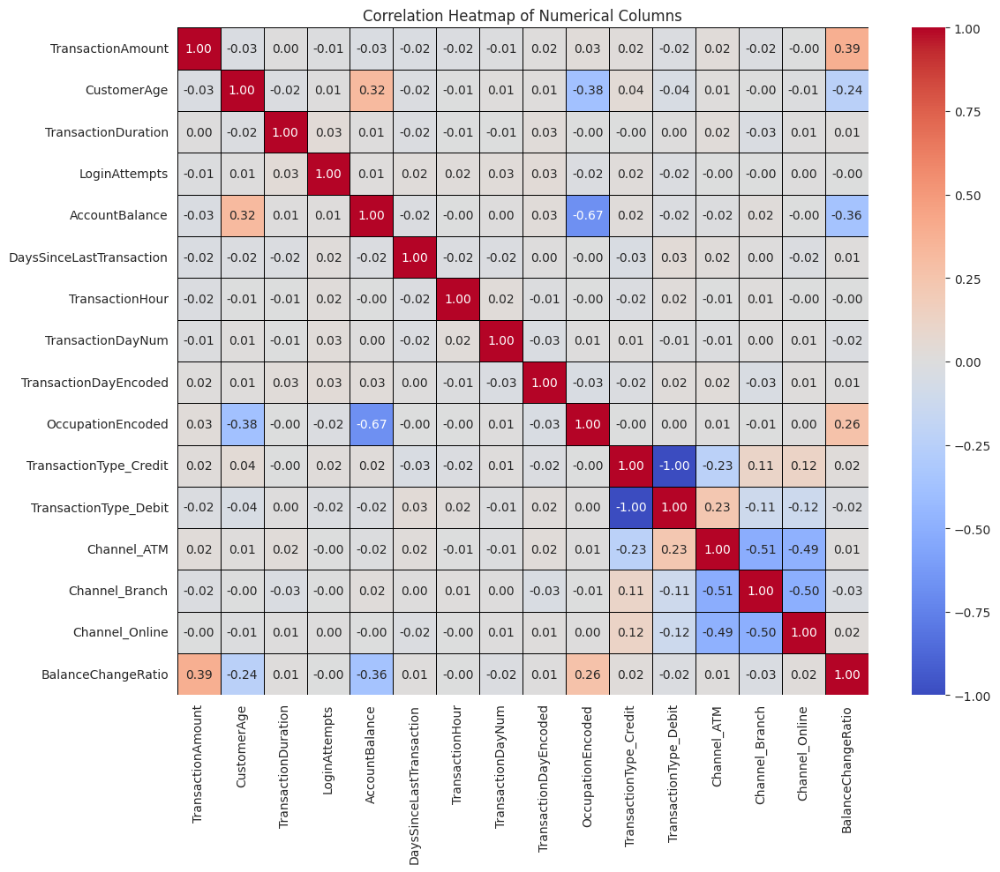

In [155]:
# Correlation Heatmap for Numerical Variables
if all(col in df.columns for col in numerical_cols):
    plt.figure(figsize=(12, 10))
    corr_matrix = df[numerical_cols].corr()
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f",
                linewidths=.5, linecolor='black')
    plt.title('Correlation Heatmap of Numerical Columns')
    plt.tight_layout()
    plt.show()
else:
    print("Warning: One or more numerical columns not found. Skipping heatmap.")

In [156]:
# Identify numerical columns (excluding object types, which are typically categorical)
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Identify categorical columns (object and category types)
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

print("Numerical Columns:")
print(numerical_cols)
print("\nCategorical Columns:")
print(categorical_cols)

Numerical Columns:
['TransactionAmount', 'CustomerAge', 'TransactionDuration', 'LoginAttempts', 'AccountBalance', 'DaysSinceLastTransaction', 'TransactionHour', 'TransactionDayNum', 'TransactionDayEncoded', 'OccupationEncoded', 'TransactionType_Credit', 'TransactionType_Debit', 'Channel_ATM', 'Channel_Branch', 'Channel_Online', 'BalanceChangeRatio']

Categorical Columns:
['TransactionID', 'AccountID', 'TransactionType', 'Location', 'DeviceID', 'IP Address', 'MerchantID', 'Channel', 'CustomerOccupation', 'TransactionDay', 'AgeBracket']


Box Plots for Comparing Numerical vs. Categorical Variables


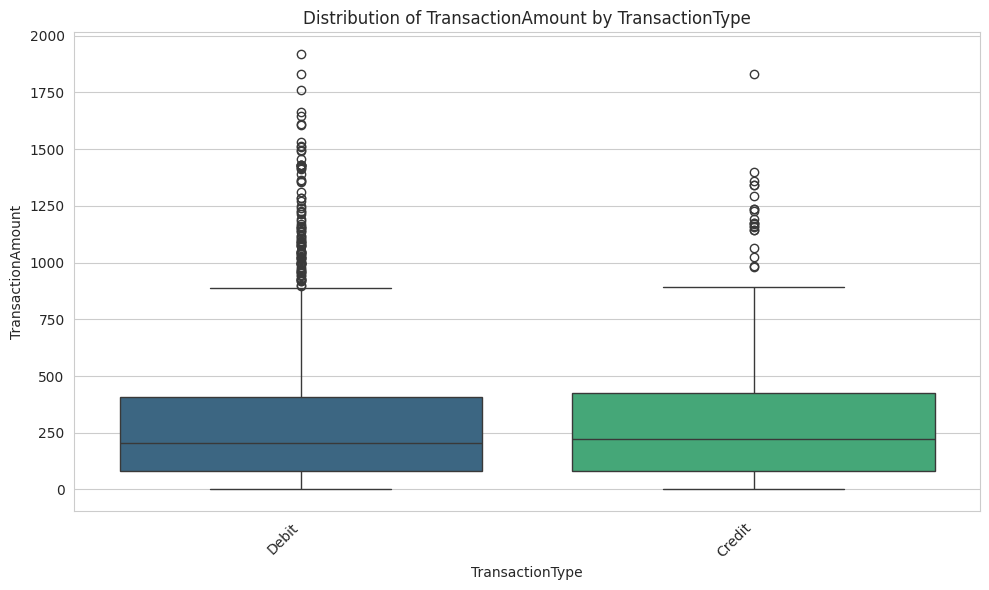

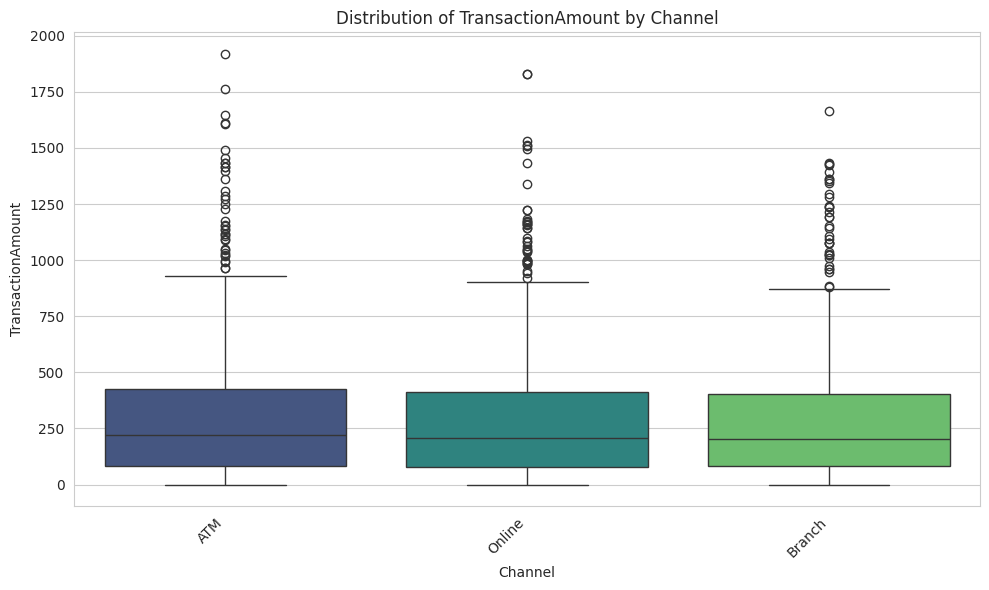

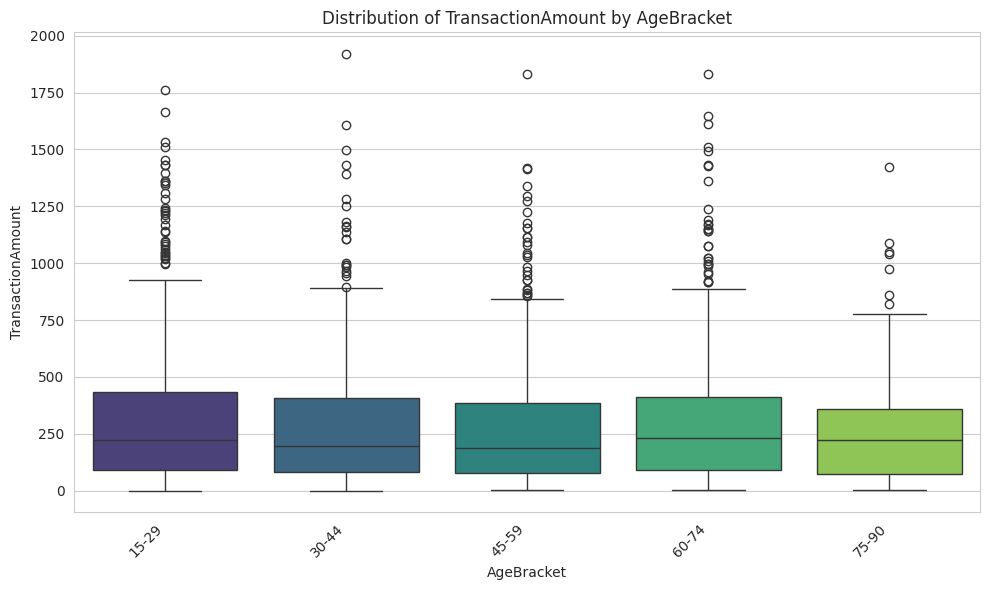

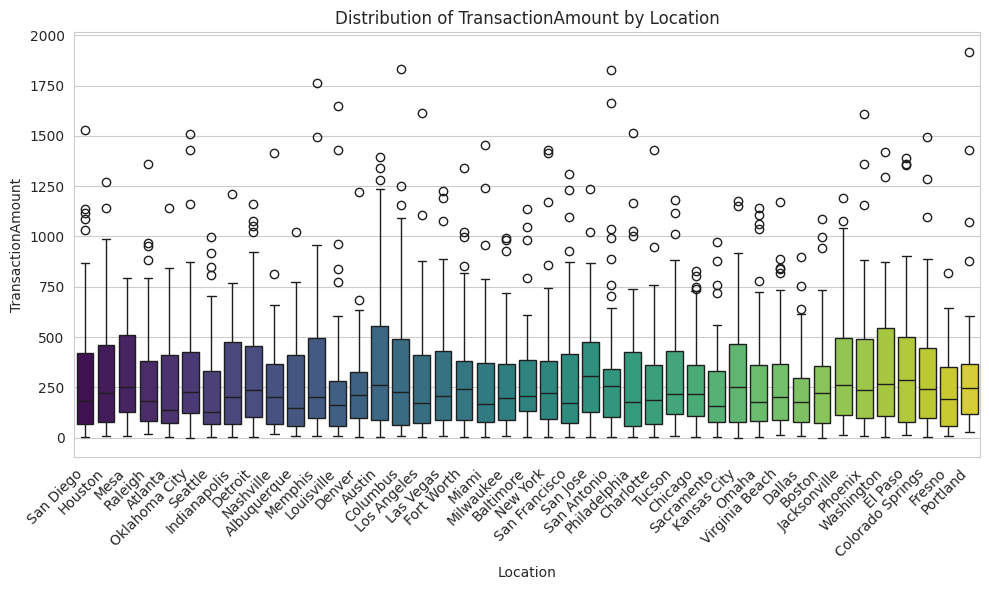

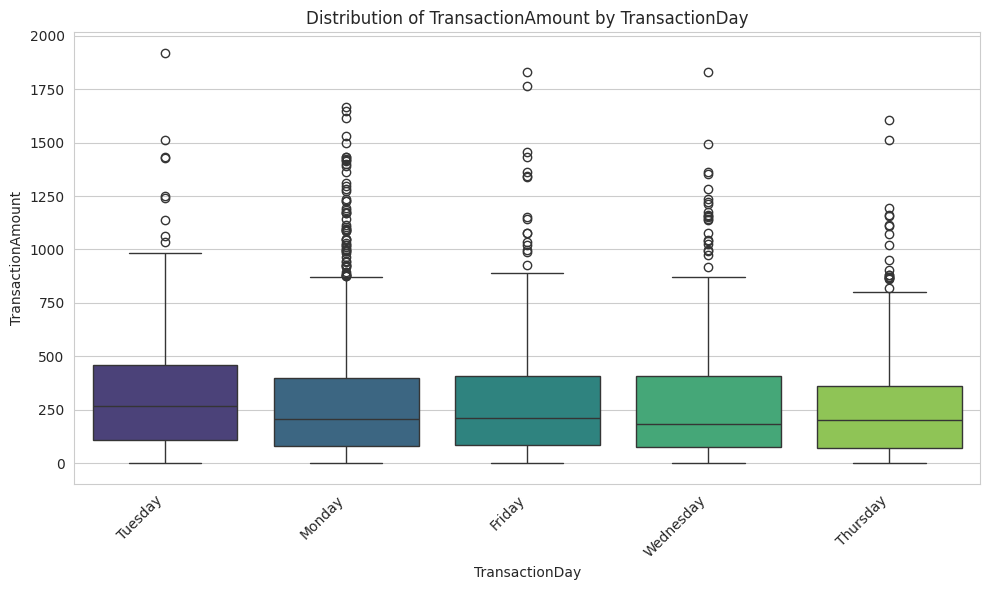

...

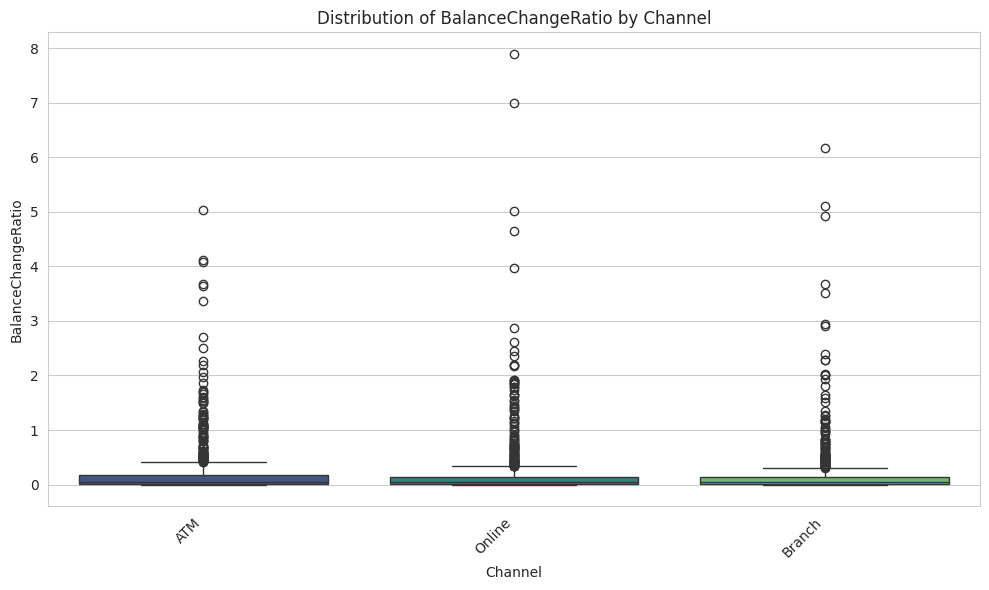

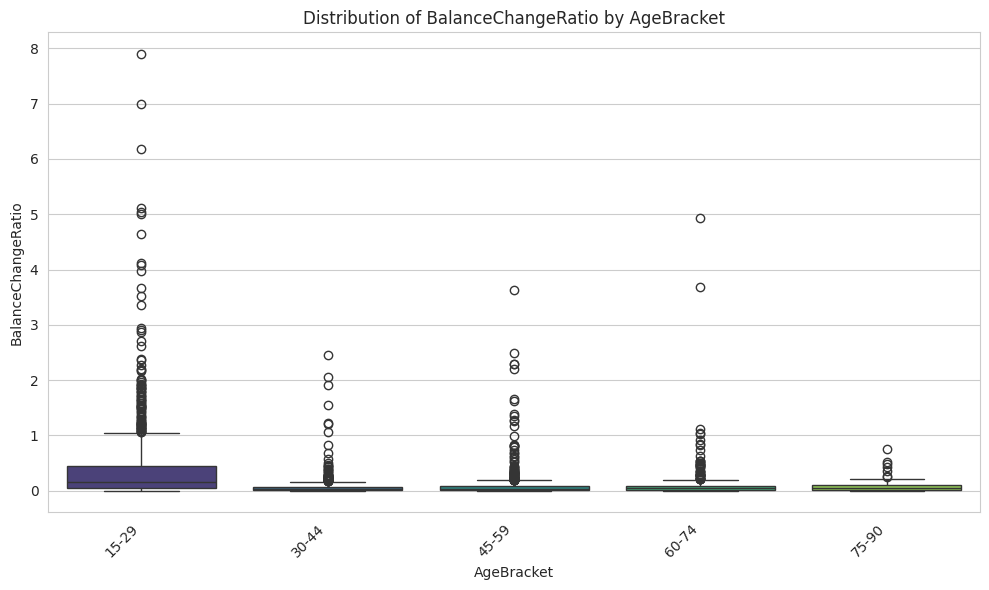

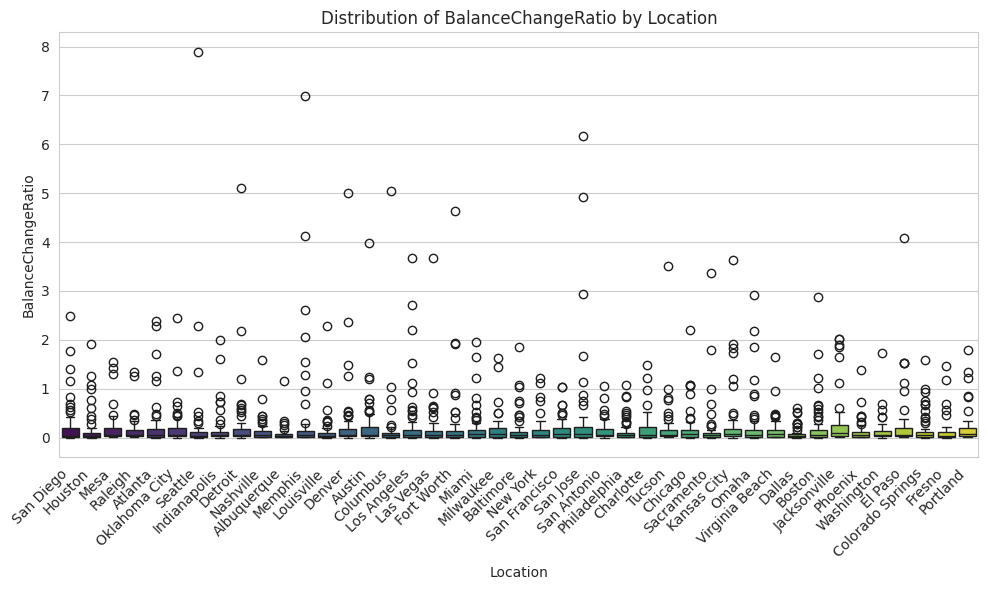

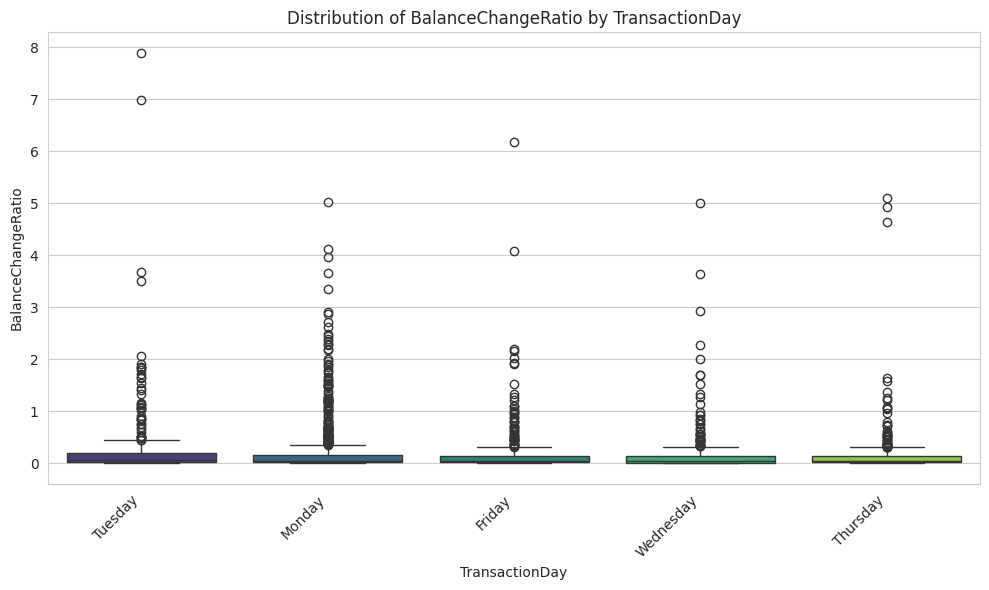

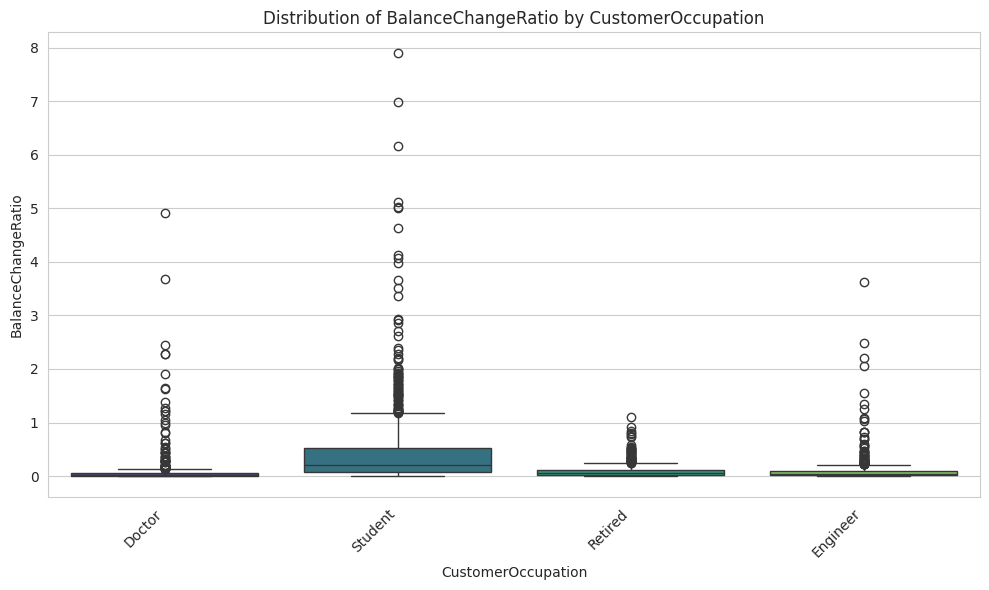

In [157]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the lists of columns to iterate through for boxplot
numerical_cols = ['TransactionAmount', 'AccountBalance', 'TransactionDuration', 'DaysSinceLastTransaction', 'BalanceChangeRatio']
categorical_cols = ['TransactionType', 'Channel', 'AgeBracket', 'Location', 'TransactionDay', 'CustomerOccupation']

print("Box Plots for Comparing Numerical vs. Categorical Variables")

for num_col in numerical_cols:
    for cat_col in categorical_cols:
        if num_col in df.columns and cat_col in df.columns:
            plt.figure(figsize=(10, 6))
            # Create a box plot to visualize the distribution of the numerical variable
            # across each category
            sns.boxplot(x=cat_col, y=num_col, data=df, palette='viridis', hue=cat_col, legend=False)
            plt.title(f'Distribution of {num_col} by {cat_col}')
            plt.xlabel(cat_col)
            plt.ylabel(num_col)
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()
        else:
            print(f"Warning: Columns '{num_col}' or '{cat_col}' not found. Skipping plot.")


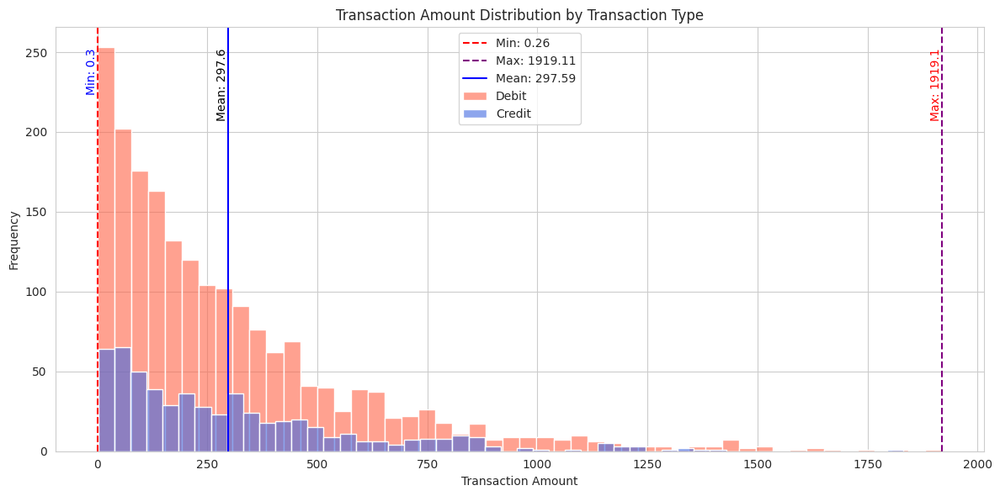

In [158]:
# Transaction Amount Distribution by Transaction Type
debit = df[df['TransactionType'] == 'Debit']['TransactionAmount']
credit = df[df['TransactionType'] == 'Credit']['TransactionAmount']

# Summary statistics
min_val = df['TransactionAmount'].min()
max_val = df['TransactionAmount'].max()
mean_val = df['TransactionAmount'].mean()

# Plot Debit & Credit
plt.figure(figsize=(12, 6))
sns.histplot(debit, bins=50, color='tomato', label='Debit', alpha=0.6, edgecolor=None)
sns.histplot(credit, bins=50, color='royalblue', label='Credit', alpha=0.6, edgecolor=None)

# Add reference lines
plt.axvline(min_val, color='red', linestyle='--', label=f'Min: {min_val:.2f}')
plt.axvline(max_val, color='purple', linestyle='--', label=f'Max: {max_val:.2f}')
plt.axvline(mean_val, color='blue', linestyle='-', label=f'Mean: {mean_val:.2f}')

# Annotate each line with value
plt.text(min_val, plt.ylim()[1]*0.95, f'Min: {min_val:.1f}', color='blue', rotation=90, va='top', ha='right')
plt.text(mean_val, plt.ylim()[1]*0.95, f'Mean: {mean_val:.1f}', color='black', rotation=90, va='top', ha='right')
plt.text(max_val, plt.ylim()[1]*0.95, f'Max: {max_val:.1f}', color='red', rotation=90, va='top', ha='right')


plt.title('Transaction Amount Distribution by Transaction Type')
plt.xlabel('Transaction Amount')
plt.ylabel('Frequency')
plt.legend()
plt.tight_layout()
plt.show()


We found that on average, customers spend around USD 298 per transaction, with amounts ranging from USD 0.30 to USD 1,919. Debit transactions appear more frequent and higher in value compared to credits. Fort Worth stands out as the city with the most transactions, totaling 70, while Branch is the most commonly used channel, recording 868 transactions.

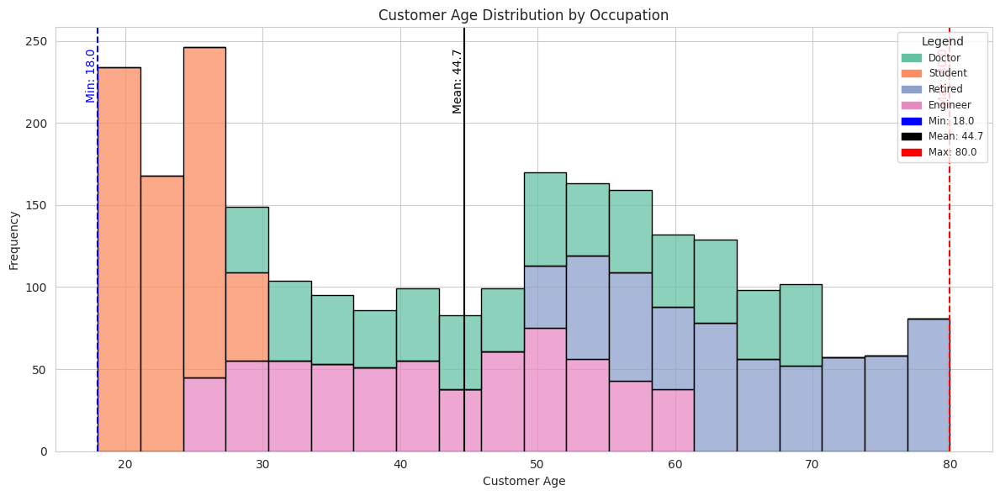

In [159]:
# Customer Age Distribution by Occupation
df_clean = df.dropna(subset=['CustomerOccupation'])
occupations = df_clean['CustomerOccupation'].unique()
palette = sns.color_palette('Set2', n_colors=len(occupations))
occupation_color_map = dict(zip(occupations, palette))

# Calculate stats
min_age = df_clean['CustomerAge'].min()
max_age = df_clean['CustomerAge'].max()
mean_age = df_clean['CustomerAge'].mean()

# Plot
plt.figure(figsize=(12, 6))
sns.histplot(
    data=df_clean,
    x='CustomerAge',
    hue='CustomerOccupation',
    bins=20,
    multiple='stack',
    palette=occupation_color_map,
    edgecolor='black'
)

# Add vertical lines
plt.axvline(min_age, color='blue', linestyle='--', linewidth=1.5)
plt.axvline(mean_age, color='black', linestyle='-', linewidth=1.5)
plt.axvline(max_age, color='red', linestyle='--', linewidth=1.5)

# Annotate each line with value
plt.text(min_age, plt.ylim()[1]*0.95, f'Min: {min_age:.1f}', color='blue', rotation=90, va='top', ha='right')
plt.text(mean_age, plt.ylim()[1]*0.95, f'Mean: {mean_age:.1f}', color='black', rotation=90, va='top', ha='right')
plt.text(max_age, plt.ylim()[1]*0.95, f'Max: {max_age:.1f}', color='red', rotation=90, va='top', ha='right')

# Title & axis labels
plt.title('Customer Age Distribution by Occupation')
plt.xlabel('Customer Age')
plt.ylabel('Frequency')

# Create legend
occupation_legend = [Patch(color=color, label=occupation) for occupation, color in occupation_color_map.items()]
stat_legend = [
    Patch(color='blue', label=f'Min: {min_age:.1f}'),
    Patch(color='black', label=f'Mean: {mean_age:.1f}'),
    Patch(color='red', label=f'Max: {max_age:.1f}')
]

# Combine legends
plt.legend(
    handles=occupation_legend + stat_legend,
    title='Legend',
    title_fontsize='medium',
    fontsize='small',
    loc='upper right'
)

plt.tight_layout()
plt.show()


Customer ages range from 18 to 80 years old, with an average age of 44. Notably, transactions are dominated by Students, accounting for 657 transactions, followed closely by Doctors and Engineers with 631 and 625 transactions, respectively.

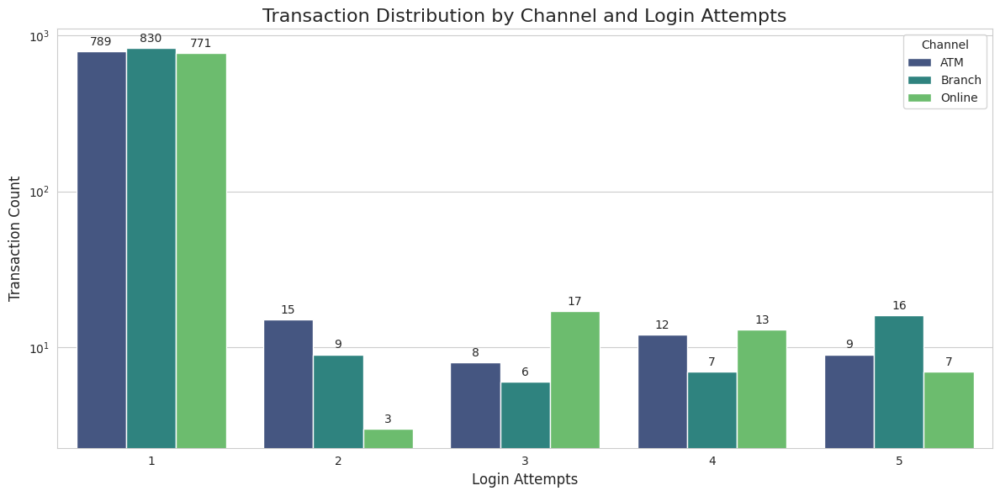

In [160]:
channel_login_counts = df.groupby(['LoginAttempts', 'Channel']).size().reset_index(name='TransactionCount')

plt.figure(figsize=(12, 6))
ax_log = sns.barplot(
    data=channel_login_counts,
    x='LoginAttempts',
    y='TransactionCount',
    hue='Channel',
    palette='viridis'
)

# Apply a log scale to the y-axis
ax_log.set_yscale('log')

# Add values on top of each bar, adjusting for the log scale
for p in ax_log.patches:
    ax_log.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom',
                xytext=(0, 3), # Adjust text position for log scale
                textcoords='offset points')

# Set the title and labels
ax_log.set_title('Transaction Distribution by Channel and Login Attempts', fontsize=16)
ax_log.set_xlabel('Login Attempts', fontsize=12)
ax_log.set_ylabel('Transaction Count', fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()


Most customers required only one login attempt, but five login attempts were also observed in 32 out of 2,512 transactions, making them unusual but not rare. With the most channel having 5 login attempts is Branch.

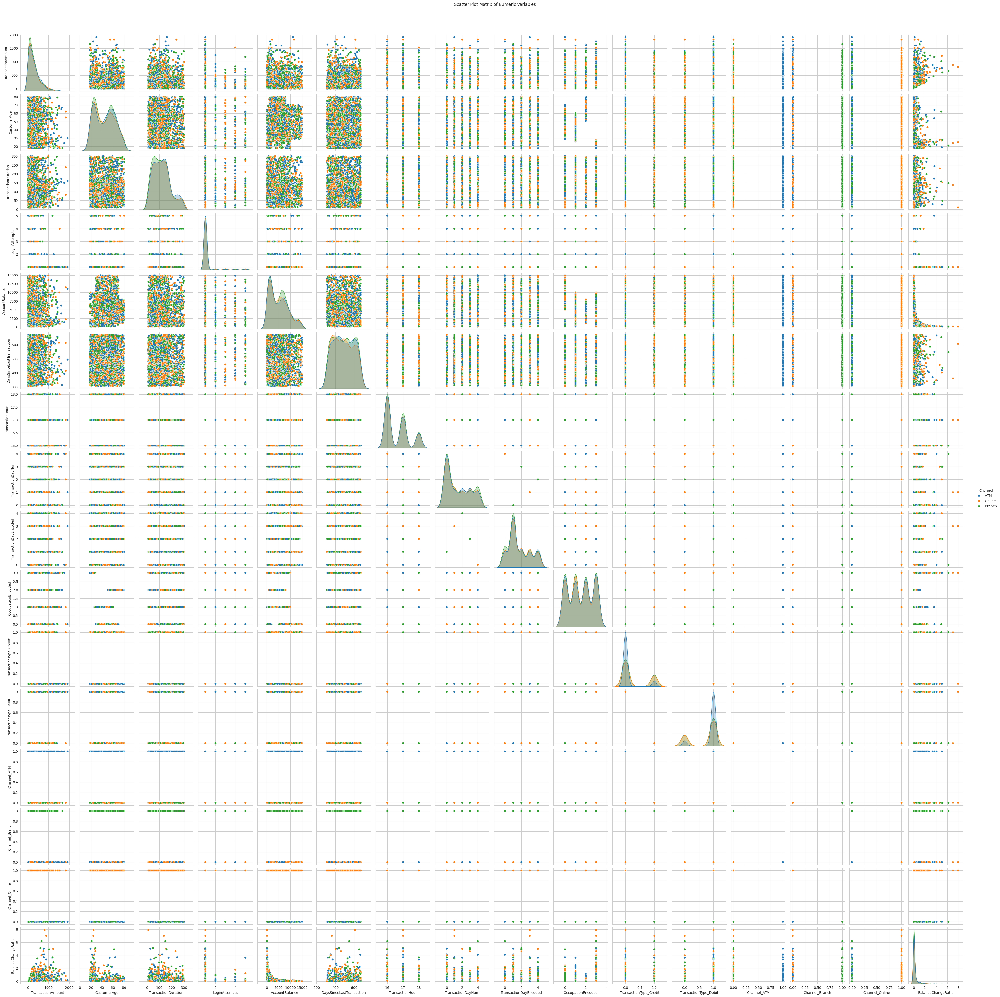

In [161]:
# Use seaborn's pairplot function to create a matrix of scatter plots.
# The diagonal plots show the distribution of a single variable (a histogram).
sns.pairplot(df, hue="Channel")

plt.suptitle('Scatter Plot Matrix of Numeric Variables', y=1.02)
plt.show()

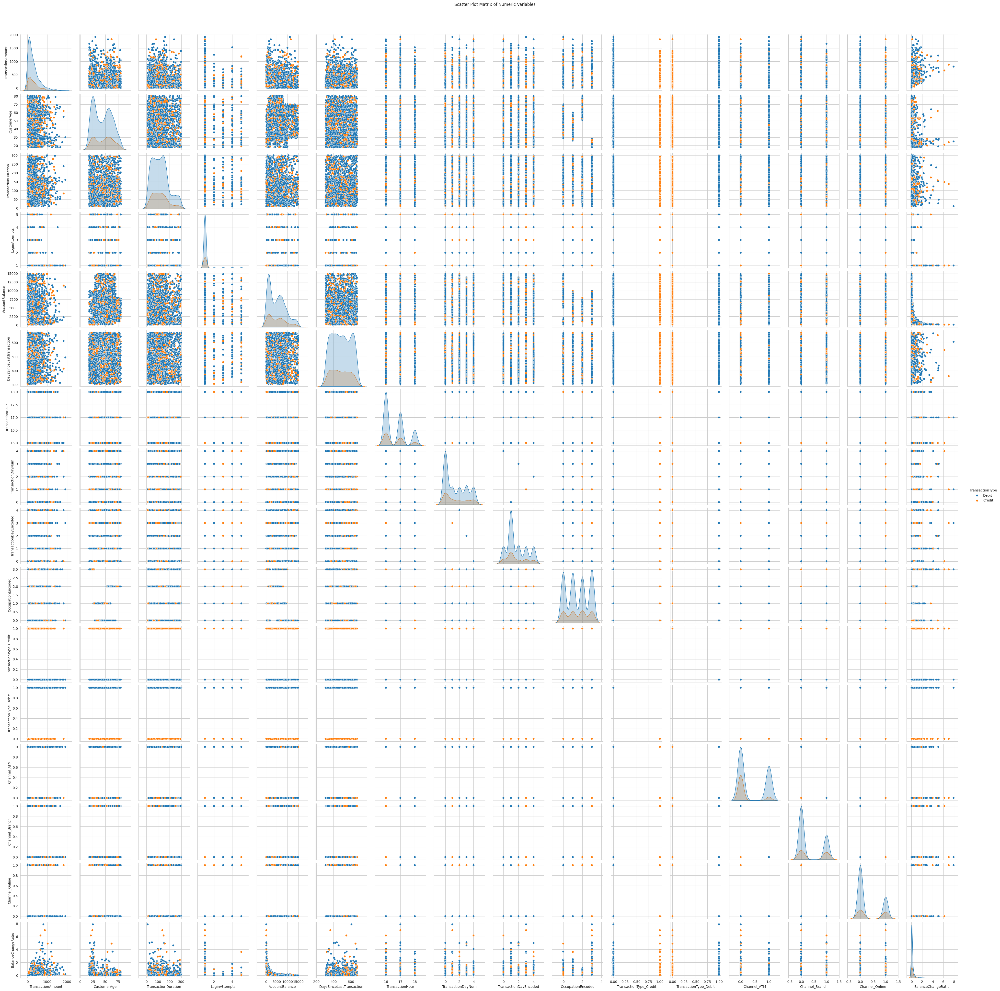

In [162]:
# Use seaborn's pairplot function to create a matrix of scatter plots.
# The diagonal plots show the distribution of a single variable (a histogram).
sns.pairplot(df, hue="TransactionType")

plt.suptitle('Scatter Plot Matrix of Numeric Variables', y=1.02)
plt.show()

In [167]:
df.head()

,TransactionID,AccountID,TransactionAmount,TransactionDate,TransactionType,Location,DeviceID,IP Address,MerchantID,Channel,CustomerAge,CustomerOccupation,TransactionDuration,LoginAttempts,AccountBalance,PreviousTransactionDate,DaysSinceLastTransaction,TransactionHour,TransactionDayNum,TransactionDay,TransactionDayEncoded,OccupationEncoded,TransactionType_Credit,TransactionType_Debit,Channel_ATM,Channel_Branch,Channel_Online,BalanceChangeRatio,AgeBracket,is_outlier
0,TX000001,AC00128,14.09,2023-04-11 16:29:14,Debit,San Diego,D000380,162.198.218.92,M015,ATM,70,Doctor,81,1,5112.21,2024-11-04 08:08:08,572,16,1,Tuesday,3,0,0.0,1.0,1.0,0.0,0.0,0.002756,60-74,0
1,TX000002,AC00455,376.24,2023-06-27 16:44:19,Debit,Houston,D000051,13.149.61.4,M052,ATM,68,Doctor,141,1,13758.91,2024-11-04 08:09:35,495,16,1,Tuesday,3,0,0.0,1.0,1.0,0.0,0.0,0.027345,60-74,0
2,TX000003,AC00019,126.29,2023-07-10 18:16:08,Debit,Mesa,D000235,215.97.143.157,M009,Online,19,Student,56,1,1122.35,2024-11-04 08:07:04,482,18,0,Monday,1,3,0.0,1.0,0.0,0.0,1.0,0.112523,15-29,0
3,TX000004,AC00070,184.50,2023-05-05 16:32:11,Debit,Raleigh,D000187,200.13.225.150,M002,Online,26,Student,25,1,8569.06,2024-11-04 08:09:06,548,16,4,Friday,0,3,0.0,1.0,0.0,0.0,1.0,0.021531,15-29,0
4,TX000005,AC00411,13.45,2023-10-16 17:51:24,Credit,Atlanta,D000308,65.164.3.100,M091,Online,26,Student,198,1,7429.40,2024-11-04 08:06:39,384,17,0,Monday,1,3,1.0,0.0,0.0,0.0,1.0,0.001810,15-29,0


In [168]:
import pandas as pd
from sklearn.ensemble import IsolationForest

# For this demonstration, we'll use a copy of the dataframe
# to avoid modifying the original
df_for_analysis = df.copy()

# Define the numerical columns to use for multivariate outlier detection
# These are the same suspicious variables we identified earlier
columns_for_detection = ['TransactionAmount', 'BalanceChangeRatio', 'TransactionDuration', 'LoginAttempts', 'CustomerAge', 'DaysSinceLastTransaction']

# Extract the data for the selected columns
X = df_for_analysis[columns_for_detection]

# Initialize the Isolation Forest model
# The 'contamination' parameter is a crucial hyperparameter that specifies the expected proportion of outliers in the dataset.
# We can use 'auto' to let the algorithm estimate a contamination level but for real-world scenarios, a specific value is often preferred.
model = IsolationForest(contamination=0.05, random_state=42)

# Fit the model to the data and predict the anomalies
# The fit_predict method returns -1 for outliers and 1 for inliers.
df_for_analysis['outlier_label'] = model.fit_predict(X)

# Filter the dataframe to show only the outliers
# Outliers are marked with -1
outliers = df_for_analysis[df_for_analysis['outlier_label'] == -1]

# Print results
print("--- Multivariate Anomaly Detection with Isolation Forest ---")
print("-" * 65)
print(f"\nTotal number of outliers detected: {len(outliers)}")
print("\nSample of detected outlier transactions:")
print(outliers[['TransactionID'] + columns_for_detection].head().to_string(index=False))

print("\n" + "-" * 65)
print("Analysis complete.")

outliers.to_excel('outliers.xlsx', index=False)


--- Multivariate Anomaly Detection with Isolation Forest ---
-----------------------------------------------------------------

Total number of outliers detected: 126

Sample of detected outlier transactions:
TransactionID  TransactionAmount  BalanceChangeRatio  TransactionDuration  LoginAttempts  CustomerAge  DaysSinceLastTransaction
     TX000014             781.76            4.121250                  123              1           26                       349
     TX000027             246.93            0.366719                  158              5           23                       566
     TX000034             877.81            2.200025                  150              1           22                       601
     TX000075            1212.51            2.001007                   24              1           20                       396
     TX000108             756.59            1.798621                   17              1           27                       608

----------------------

--- Visualizing Outliers from Isolation Forest with a Pair Plot ---


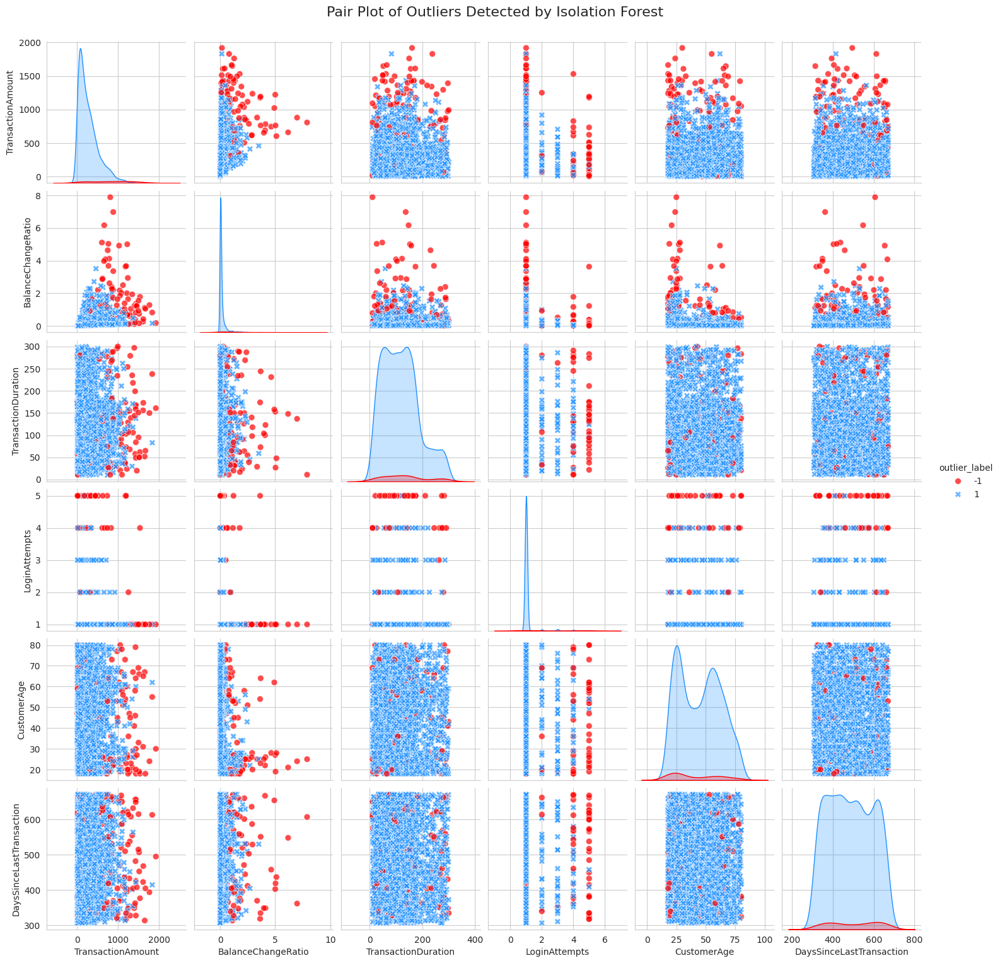

In [169]:
print("--- Visualizing Outliers from Isolation Forest with a Pair Plot ---")

# Pairplot to visualize the relationship between all the columns used for outlier detection.
sns.pairplot(
    data=df_for_analysis,
    vars=columns_for_detection, # The columns to plot against each other
    hue='outlier_label', # Color points by their outlier status
    palette={1: 'dodgerblue', -1: 'red'}, # Custom colors for inliers and outliers
    diag_kind='kde', # Use a kernel density estimate on the diagonal
    markers=['o', 'X'], # Use different markers for inliers and outliers
    plot_kws={'alpha': 0.7, 's': 50} # Additional plot keyword arguments
)

plt.suptitle('Pair Plot of Outliers Detected by Isolation Forest', y=1.02, fontsize=16)
plt.show()

In [170]:
import pandas as pd

# The 'outliers' DataFrame is the result of the Isolation Forest analysis
df['is_outlier'] = df.index.isin(outliers.index).astype(int)
outliers_with_categories = df[df['is_outlier'] == 1]

# Define the categorical columns you want to analyze
categorical_columns = ['TransactionType', 'Channel', 'AgeBracket', 'CustomerOccupation', 'TransactionDay', 'Location']

print("--- Categorical Breakdown of Outliers ---")
print("-" * 40)

for column in categorical_columns:
    try:
        # Check if the column exists and has non-null values
        if column in outliers_with_categories.columns and not outliers_with_categories[column].isnull().all():
            print(f"\nBreakdown for '{column}':")
            # Group by the categorical column and count the number of outliers
            outlier_counts = outliers_with_categories.groupby(column).size().reset_index(name='OutlierCount')
            # Calculate the percentage for a more intuitive understanding
            total_outliers = len(outliers_with_categories)
            outlier_counts['Percentage'] = (outlier_counts['OutlierCount'] / total_outliers) * 100

            print(outlier_counts.to_string(index=False))
        else:
            print(f"\nWarning: Column '{column}' not found or contains only null values in the outlier dataset.")
    except Exception as e:
        print(f"\nError processing column '{column}': {e}")

print("\n" + "-" * 40)
print("Categorical analysis complete.")


--- Categorical Breakdown of Outliers ---
----------------------------------------

Breakdown for 'TransactionType':
TransactionType  OutlierCount  Percentage
         Credit            30   23.809524
          Debit            96   76.190476

Breakdown for 'Channel':
Channel  OutlierCount  Percentage
    ATM            46   36.507937
 Branch            47   37.301587
 Online            33   26.190476

Breakdown for 'AgeBracket':
AgeBracket  OutlierCount  Percentage
     15-29            59   46.825397
     30-44            13   10.317460
     45-59            24   19.047619
     60-74            22   17.460317
     75-90             8    6.349206

Breakdown for 'CustomerOccupation':
CustomerOccupation  OutlierCount  Percentage
            Doctor            26   20.634921
          Engineer            19   15.079365
           Retired            27   21.428571
           Student            54   42.857143

Breakdown for 'TransactionDay':
TransactionDay  OutlierCount  Percentage
        

/tmp/ipython-input-565169641.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  outlier_counts = outliers_with_categories.groupby(column).size().reset_index(name='OutlierCount')
